# Data Analysis

In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from PIL import Image

# Define the dataset path
data_dir = "./HAM"

# Load the metadata CSV file
metadata_file = os.path.join(data_dir, "HAM10000_metadata.csv")
metadata = pd.read_csv(metadata_file)

# Display basic information about the dataset
print(metadata.head())
print("\nDataset shape:", metadata.shape)
print("\nUnique classes:", metadata['dx'].unique())
print("\nClass distribution:")
print(metadata['dx'].value_counts())


     lesion_id      image_id   dx dx_type   age   sex localization
0  HAM_0000118  ISIC_0027419  bkl   histo  80.0  male        scalp
1  HAM_0000118  ISIC_0025030  bkl   histo  80.0  male        scalp
2  HAM_0002730  ISIC_0026769  bkl   histo  80.0  male        scalp
3  HAM_0002730  ISIC_0025661  bkl   histo  80.0  male        scalp
4  HAM_0001466  ISIC_0031633  bkl   histo  75.0  male          ear

Dataset shape: (10015, 7)

Unique classes: ['bkl' 'nv' 'df' 'mel' 'vasc' 'bcc' 'akiec']

Class distribution:
dx
nv       6705
mel      1113
bkl      1099
bcc       514
akiec     327
vasc      142
df        115
Name: count, dtype: int64


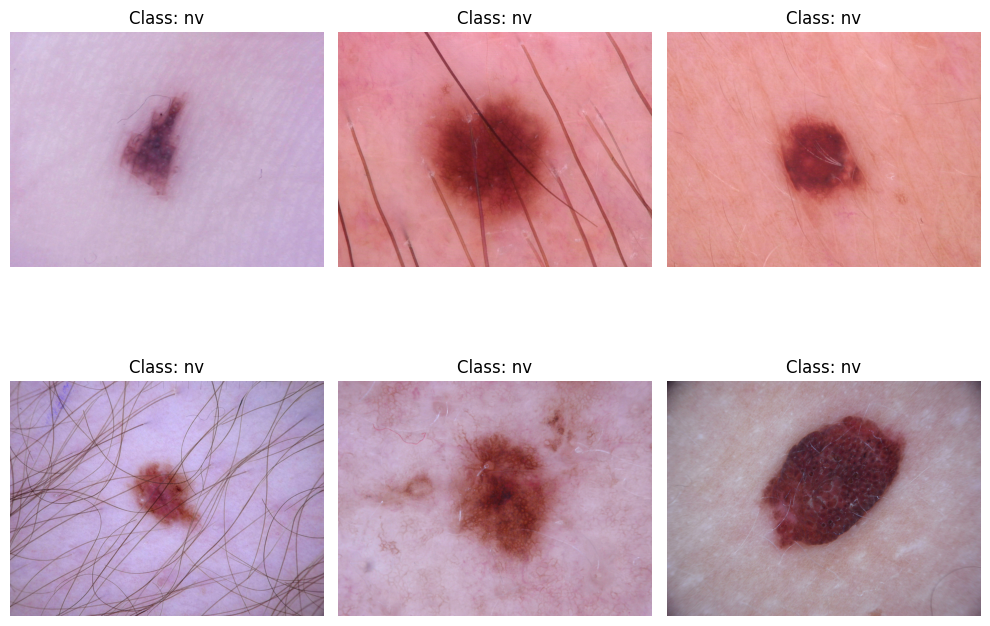

In [2]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Define paths to both image directories
data_dir = "./HAM"
image_dir_1 = os.path.join(data_dir, "HAM10000_images_part_1")
image_dir_2 = os.path.join(data_dir, "HAM10000_images_part_2")

# Function to locate the image in either directory
def get_image_path(image_id):
    for image_dir in [image_dir_1, image_dir_2]:
        image_path = os.path.join(image_dir, image_id + '.jpg')
        if os.path.exists(image_path):
            return image_path
    return None  # If the image is not found

# Load metadata
metadata_file = os.path.join(data_dir, "HAM10000_metadata.csv")
metadata = pd.read_csv(metadata_file)

# Display a few sample images with their labels
sample_images = metadata.sample(6)

plt.figure(figsize=(10, 8))
for i, (index, row) in enumerate(sample_images.iterrows()):
    image_path = get_image_path(row['image_id'])  # Get the correct image path
    if image_path:
        image = Image.open(image_path)
        plt.subplot(2, 3, i + 1)
        plt.imshow(image)
        plt.title(f"Class: {row['dx']}")
        plt.axis("off")
    else:
        print(f"Image not found: {row['image_id']}")
plt.tight_layout()
plt.show()


# Data Preprocessing

In [3]:
import tensorflow as tf
from sklearn.model_selection import train_test_split

# Define constants
IMAGE_SIZE = (224, 224)  # Resize all images to 224x224
BATCH_SIZE = 32          # Batch size for training

# Preprocessing function
def preprocess_image(image_path, label):
    image = tf.keras.preprocessing.image.load_img(image_path, target_size=IMAGE_SIZE)
    image = tf.keras.preprocessing.image.img_to_array(image) / 255.0  # Normalize to [0, 1]
    return image, label


In [4]:
# Stratified train-validation-test split
train_metadata, test_metadata = train_test_split(metadata, test_size=0.2, stratify=metadata['dx'], random_state=42)
train_metadata, val_metadata = train_test_split(train_metadata, test_size=0.2, stratify=train_metadata['dx'], random_state=42)

print(f"Training set: {len(train_metadata)} images")
print(f"Validation set: {len(val_metadata)} images")
print(f"Test set: {len(test_metadata)} images")


Training set: 6409 images
Validation set: 1603 images
Test set: 2003 images


### Prepare Data Generators 

In [5]:
def get_image_path(image_id):
    # Check both image directories for the file
    for image_dir in [image_dir_1, image_dir_2]:
        image_path = os.path.join(image_dir, image_id + '.jpg')
        if os.path.exists(image_path):
            return image_path
    return None  # Return None if the image is not found


In [6]:
metadata['image_path'] = metadata['image_id'].apply(lambda x: get_image_path(x))
# Check the first few rows of the DataFrame
print(metadata[['image_id', 'image_path']].head())

# Verify that all paths are valid
print("Are all paths valid?", metadata['image_path'].apply(lambda x: os.path.exists(x) if x else False).all())


       image_id                                     image_path
0  ISIC_0027419  ./HAM/HAM10000_images_part_1/ISIC_0027419.jpg
1  ISIC_0025030  ./HAM/HAM10000_images_part_1/ISIC_0025030.jpg
2  ISIC_0026769  ./HAM/HAM10000_images_part_1/ISIC_0026769.jpg
3  ISIC_0025661  ./HAM/HAM10000_images_part_1/ISIC_0025661.jpg
4  ISIC_0031633  ./HAM/HAM10000_images_part_2/ISIC_0031633.jpg
Are all paths valid? True


In [7]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Initialize data generators
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,  # Normalize
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)

val_test_datagen = ImageDataGenerator(rescale=1.0/255.0)  # Only normalize for validation/test


In [8]:
# Add the full image path to the metadata DataFrame
metadata['image_path'] = metadata['image_id'].apply(lambda x: get_image_path(x))

In [9]:
from sklearn.model_selection import train_test_split

# Stratified train-validation-test split
train_metadata, test_metadata = train_test_split(metadata, test_size=0.2, stratify=metadata['dx'], random_state=42)
train_metadata, val_metadata = train_test_split(train_metadata, test_size=0.2, stratify=train_metadata['dx'], random_state=42)

# Print the sizes of the splits
print(f"Training set: {len(train_metadata)} images")
print(f"Validation set: {len(val_metadata)} images")
print(f"Test set: {len(test_metadata)} images")


Training set: 6409 images
Validation set: 1603 images
Test set: 2003 images


In [10]:
# Verify that image_path exists in all splits
print("Columns in train_metadata:", train_metadata.columns)
print("Columns in val_metadata:", val_metadata.columns)
print("Columns in test_metadata:", test_metadata.columns)


Columns in train_metadata: Index(['lesion_id', 'image_id', 'dx', 'dx_type', 'age', 'sex', 'localization',
       'image_path'],
      dtype='object')
Columns in val_metadata: Index(['lesion_id', 'image_id', 'dx', 'dx_type', 'age', 'sex', 'localization',
       'image_path'],
      dtype='object')
Columns in test_metadata: Index(['lesion_id', 'image_id', 'dx', 'dx_type', 'age', 'sex', 'localization',
       'image_path'],
      dtype='object')


In [11]:
# Define the generator function
def create_generator(data, datagen):
    return datagen.flow_from_dataframe(
        dataframe=data,
        x_col='image_path',  # Use the new column with full image paths
        y_col='dx',
        target_size=IMAGE_SIZE,
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=True
    )

# Recreate data generators
train_generator = create_generator(train_metadata, train_datagen)
val_generator = create_generator(val_metadata, val_test_datagen)
test_generator = create_generator(test_metadata, val_test_datagen)


Found 6409 validated image filenames belonging to 7 classes.
Found 1603 validated image filenames belonging to 7 classes.
Found 2003 validated image filenames belonging to 7 classes.


### Verify preprocessing 

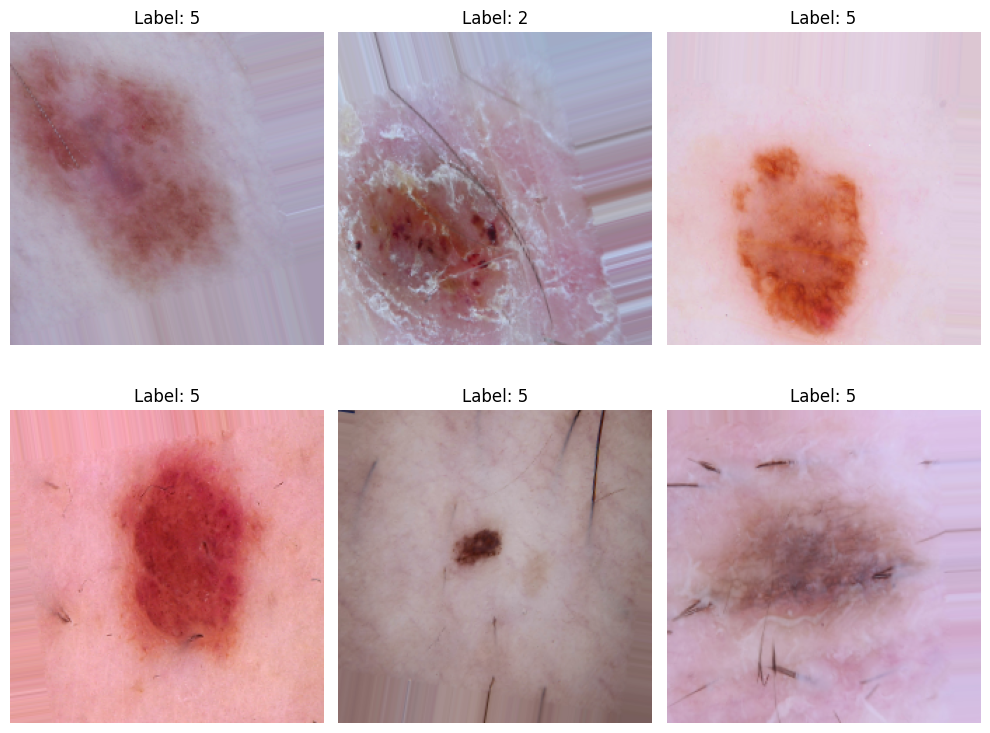

In [12]:
# Visualize a few preprocessed images from the training generator
images, labels = next(train_generator)

plt.figure(figsize=(10, 8))
for i in range(6):
    plt.subplot(2, 3, i + 1)
    plt.imshow(images[i])
    plt.title(f"Label: {labels[i].argmax()}")
    plt.axis("off")
plt.tight_layout()
plt.show()


# Build Basic CNN Model

In [13]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Define the CNN architecture
model = models.Sequential([
    # Convolutional layers
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    # Flatten and Dense layers
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),  # Add dropout to reduce overfitting
    layers.Dense(7, activation='softmax')  # 7 classes for skin lesion types
])

# Compile the model
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Display the model architecture
model.summary()


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    11,075,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,169,863 (42.61 MB)

 Trainable params: 11,169,863 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

In [14]:
# Train the model
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=10,  # Start with 10 epochs; adjust based on performance
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_steps=val_generator.samples // val_generator.batch_size
)


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 110s 544ms/step - accuracy: 0.6442 - loss: 1.2512 - val_accuracy: 0.6687 - val_loss: 0.9936
Epoch 2/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 271us/step - accuracy: 0.7188 - loss: 0.8318 - val_accuracy: 1.0000 - val_loss: 0.0835
Epoch 3/10


2024-12-02 16:53:09.054551: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(value)
2024-12-02 16:53:09.090897: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


200/200 ━━━━━━━━━━━━━━━━━━━━ 108s 538ms/step - accuracy: 0.6690 - loss: 1.0176 - val_accuracy: 0.6700 - val_loss: 0.9276
Epoch 4/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 153us/step - accuracy: 0.5938 - loss: 1.1880 - val_accuracy: 1.0000 - val_loss: 0.0722
Epoch 5/10


2024-12-02 16:54:57.694919: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


200/200 ━━━━━━━━━━━━━━━━━━━━ 108s 537ms/step - accuracy: 0.6772 - loss: 0.9323 - val_accuracy: 0.6725 - val_loss: 0.8593
Epoch 6/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 147us/step - accuracy: 0.5938 - loss: 0.8932 - val_accuracy: 0.6667 - val_loss: 0.8676
Epoch 7/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 103s 517ms/step - accuracy: 0.6683 - loss: 0.9244 - val_accuracy: 0.6719 - val_loss: 0.8545
Epoch 8/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 142us/step - accuracy: 0.6562 - loss: 0.9018 - val_accuracy: 0.6667 - val_loss: 0.8679
Epoch 9/10


2024-12-02 16:58:29.570468: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


200/200 ━━━━━━━━━━━━━━━━━━━━ 104s 519ms/step - accuracy: 0.6661 - loss: 0.9155 - val_accuracy: 0.6806 - val_loss: 0.8379
Epoch 10/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 146us/step - accuracy: 0.7500 - loss: 0.6730 - val_accuracy: 1.0000 - val_loss: 0.2494


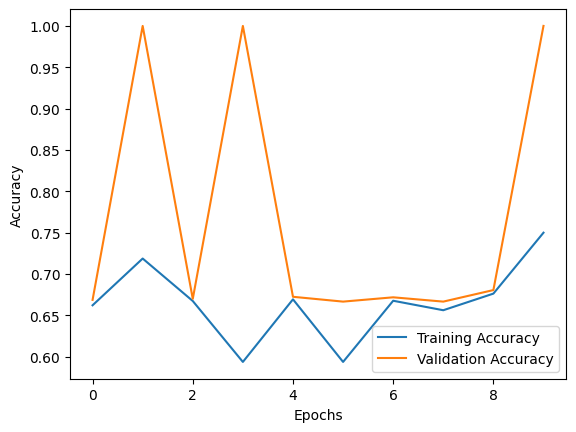

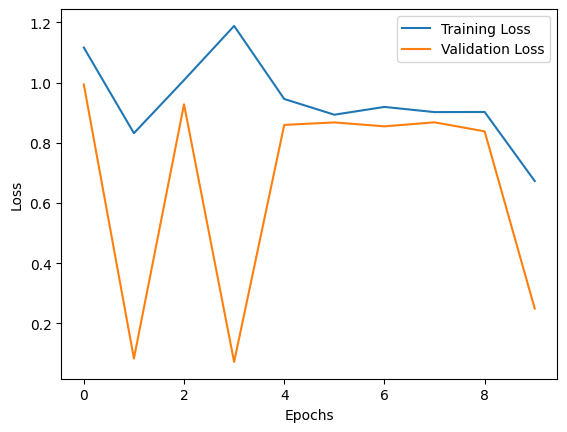

In [16]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [17]:
from tensorflow.keras.optimizers import Adam

# Adjust the learning rate
optimizer = Adam(learning_rate=0.0001)  # Start with a lower learning rate

# Compile the model with the new optimizer
model.compile(
    optimizer=optimizer,
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


In [18]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Calculate class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_metadata['dx']),
    y=train_metadata['dx']
)

# Convert to dictionary format for Keras
class_weights_dict = {i: class_weights[i] for i in range(len(class_weights))}
print("Class Weights:", class_weights_dict)

# Train the model with class weights
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=10,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_steps=val_generator.samples // val_generator.batch_size,
    class_weight=class_weights_dict  # Add class weights
)


Class Weights: {0: 4.380724538619275, 1: 2.782891880156318, 2: 1.3023775655354604, 3: 12.372586872586872, 4: 1.2859149277688604, 5: 0.2133701767819689, 6: 10.061224489795919}
Epoch 1/10


2024-12-02 17:00:26.323104: W tensorflow/core/framework/op_kernel.cc:1829] INVALID_ARGUMENT: TypeError: `generator` yielded an element that did not match the expected structure. The expected structure was (tf.float32, tf.float32, tf.float32), but the yielded element was (array([[[[0.83716756, 0.47468457, 0.43137258],
         [0.83644724, 0.49557802, 0.437293  ],
         [0.85823935, 0.5247395 , 0.46349585],
         ...,
         [0.77647066, 0.4039216 , 0.43529415],
         [0.77647066, 0.4039216 , 0.43529415],
         [0.77647066, 0.4039216 , 0.43529415]],

        [[0.8397956 , 0.47116813, 0.43311214],
         [0.83201915, 0.48498148, 0.43137258],
         [0.8518926 , 0.52389455, 0.4553126 ],
         ...,
         [0.77647066, 0.4039216 , 0.43529415],
         [0.77647066, 0.4039216 , 0.43529415],
         [0.77647066, 0.4039216 , 0.43529415]],

        [[0.84447175, 0.47584426, 0.44714054],
         [0.8343572 , 0.48030534, 0.43137258],
         [0.84487844, 0.5110352 , 0.44

InvalidArgumentError: Graph execution error:

Detected at node PyFunc defined at (most recent call last):
<stack traces unavailable>
TypeError: `generator` yielded an element that did not match the expected structure. The expected structure was (tf.float32, tf.float32, tf.float32), but the yielded element was (array([[[[0.83716756, 0.47468457, 0.43137258],
         [0.83644724, 0.49557802, 0.437293  ],
         [0.85823935, 0.5247395 , 0.46349585],
         ...,
         [0.77647066, 0.4039216 , 0.43529415],
         [0.77647066, 0.4039216 , 0.43529415],
         [0.77647066, 0.4039216 , 0.43529415]],

        [[0.8397956 , 0.47116813, 0.43311214],
         [0.83201915, 0.48498148, 0.43137258],
         [0.8518926 , 0.52389455, 0.4553126 ],
         ...,
         [0.77647066, 0.4039216 , 0.43529415],
         [0.77647066, 0.4039216 , 0.43529415],
         [0.77647066, 0.4039216 , 0.43529415]],

        [[0.84447175, 0.47584426, 0.44714054],
         [0.8343572 , 0.48030534, 0.43137258],
         [0.84487844, 0.5110352 , 0.44712937],
         ...,
         [0.77647066, 0.4039216 , 0.43529415],
         [0.77647066, 0.4039216 , 0.43529415],
         [0.77647066, 0.4039216 , 0.43529415]],

        ...,

        [[0.8258215 , 0.50011045, 0.4421017 ],
         [0.83283573, 0.5024485 , 0.44093266],
         [0.8398499 , 0.50478655, 0.43976364],
         ...,
         [0.85230666, 0.55143654, 0.47616857],
         [0.8384836 , 0.5443574 , 0.45568398],
         [0.8291319 , 0.5352543 , 0.44898462]],

        [[0.8397081 , 0.5093116 , 0.4383584 ],
         [0.8350319 , 0.5139877 , 0.43718937],
         [0.8303558 , 0.5186639 , 0.43602034],
         ...,
         [0.83542997, 0.54250795, 0.44826695],
         [0.85776633, 0.5528152 , 0.4516729 ],
         [0.8481338 , 0.5439503 , 0.46567702]],

        [[0.825414  , 0.51885265, 0.43868914],
         [0.8219069 , 0.51417655, 0.44453433],
         [0.8183998 , 0.5095004 , 0.4503795 ],
         ...,
         [0.83134073, 0.5528668 , 0.42794842],
         [0.835343  , 0.5532376 , 0.4337608 ],
         [0.82874364, 0.54553276, 0.43905658]]],


       [[[0.60175586, 0.38214803, 0.3901278 ],
         [0.61327916, 0.39548334, 0.40665296],
         [0.62480253, 0.41431084, 0.43218714],
         ...,
         [0.58059627, 0.3884394 , 0.4008163 ],
         [0.5731181 , 0.38096124, 0.39272594],
         [0.5761056 , 0.38394877, 0.40638316]],

        [[0.6041269 , 0.384519  , 0.3909181 ],
         [0.6156502 , 0.3986447 , 0.41297558],
         [0.6271735 , 0.41905284, 0.43613878],
         ...,
         [0.57921964, 0.3870628 , 0.3988275 ],
         [0.57305485, 0.380898  , 0.3941801 ],
         [0.5747693 , 0.38431376, 0.40826848]],

        [[0.6064979 , 0.38689002, 0.39170846],
         [0.6180212 , 0.401806  , 0.41929826],
         [0.6295445 , 0.4237948 , 0.44009045],
         ...,
         [0.577639  , 0.38548213, 0.39724684],
         [0.5738452 , 0.3816883 , 0.3973414 ],
         [0.57160795, 0.38431376, 0.40905884]],

        ...,

        [[0.7770738 , 0.6033142 , 0.62247133],
         [0.7800656 , 0.60274816, 0.5792378 ],
         [0.77769464, 0.6123783 , 0.6015871 ],
         ...,
         [0.658069  , 0.46591216, 0.47910982],
         [0.65332705, 0.46117017, 0.47515815],
         [0.648585  , 0.45642817, 0.4712065 ]],

        [[0.76810384, 0.6059771 , 0.59963   ],
         [0.78412443, 0.62055606, 0.6299619 ],
         [0.7806533 , 0.61986035, 0.6138043 ],
         ...,
         [0.6642586 , 0.46246904, 0.48627454],
         [0.66504884, 0.4664207 , 0.48627454],
         [0.6658392 , 0.47037238, 0.48627454]],

        [[0.77924675, 0.61402035, 0.62150747],
         [0.78143954, 0.6213811 , 0.623125  ],
         [0.78184634, 0.62072664, 0.6099125 ],
         ...,
         [0.67205596, 0.4828343 , 0.51187915],
         [0.6688945 , 0.47335032, 0.5031855 ],
         [0.6657332 , 0.46386632, 0.49449185]]],


       [[[0.8605564 , 0.6117647 , 0.65572304],
         [0.8661685 , 0.6117647 , 0.6666667 ],
         [0.86213565, 0.6033121 , 0.65821403],
         ...,
         [0.80392164, 0.5647059 , 0.5921569 ],
         [0.80392164, 0.5647059 , 0.5921569 ],
         [0.80392164, 0.5647059 , 0.5921569 ]],

        [[0.8601497 , 0.6117647 , 0.65368927],
         [0.865355  , 0.6117647 , 0.6666667 ],
         [0.8641694 , 0.6053459 , 0.66024786],
         ...,
         [0.80392164, 0.5647059 , 0.5921569 ],
         [0.80392164, 0.5647059 , 0.5921569 ],
         [0.80392164, 0.5647059 , 0.5921569 ]],

        [[0.8597429 , 0.6117647 , 0.6516555 ],
         [0.8645415 , 0.6117647 , 0.6666667 ],
         [0.8662032 , 0.6073797 , 0.66228163],
         ...,
         [0.79500884, 0.55802137, 0.58770055],
         [0.79338187, 0.5568011 , 0.586887  ],
         [0.7917548 , 0.5555808 , 0.58607346]],

        ...,

        [[0.8068301 , 0.59411234, 0.59826374],
         [0.80943215, 0.5969949 , 0.6121292 ],
         [0.81767243, 0.5993387 , 0.61631256],
         ...,
         [0.7402897 , 0.51827765, 0.53422016],
         [0.74110323, 0.51949793, 0.5334067 ],
         [0.7419168 , 0.5207182 , 0.53259313]],

        [[0.8127169 , 0.59273344, 0.6058084 ],
         [0.81403977, 0.5951748 , 0.6141674 ],
         [0.8227724 , 0.5961088 , 0.61204547],
         ...,
         [0.74509805, 0.5210015 , 0.52641934],
         [0.74509805, 0.51978123, 0.52560586],
         [0.74509805, 0.518561  , 0.52479225]],

        [[0.8172771 , 0.59257203, 0.6058751 ],
         [0.8157717 , 0.5926941 , 0.61061335],
         [0.81811553, 0.5927035 , 0.61123425],
         ...,
         [0.74804825, 0.52700126, 0.5348444 ],
         [0.74886173, 0.53066206, 0.5385052 ],
         [0.7496753 , 0.5343229 , 0.54216605]]],


       ...,


       [[[0.41176474, 0.31764707, 0.30980393],
         [0.41176474, 0.31764707, 0.30980393],
         [0.41176474, 0.31764707, 0.30980393],
         ...,
         [0.56078434, 0.5254902 , 0.5058824 ],
         [0.5623296 , 0.51930904, 0.50279176],
         [0.56163436, 0.5067324 , 0.49496767]],

        [[0.41176474, 0.31764707, 0.30980393],
         [0.41176474, 0.31764707, 0.30980393],
         [0.41176474, 0.31764707, 0.30980393],
         ...,
         [0.56078434, 0.5254902 , 0.5058824 ],
         [0.5620567 , 0.5204008 , 0.5033376 ],
         [0.5621802 , 0.5072782 , 0.49551356]],

        [[0.41176474, 0.31764707, 0.30980393],
         [0.41176474, 0.31764707, 0.30980393],
         [0.41176474, 0.31764707, 0.30980393],
         ...,
         [0.56078434, 0.5254902 , 0.5058824 ],
         [0.5617838 , 0.52149254, 0.50388354],
         [0.5627261 , 0.5078241 , 0.4960594 ]],

        ...,

        [[0.47450984, 0.36862746, 0.38823533],
         [0.47450984, 0.36862746, 0.38823533],
         [0.47450984, 0.36862746, 0.38823533],
         ...,
         [0.6052858 , 0.5044118 , 0.52006966],
         [0.6024468 , 0.49841198, 0.5112915 ],
         [0.59688795, 0.4942308 , 0.4976971 ]],

        [[0.47796285, 0.36862746, 0.38823533],
         [0.47850874, 0.36862746, 0.38823533],
         [0.4790546 , 0.36862746, 0.38823533],
         ...,
         [0.6142989 , 0.51724714, 0.532546  ],
         [0.6041122 , 0.49907756, 0.51765656],
         [0.589444  , 0.46599442, 0.47082454]],

        [[0.47891894, 0.36862746, 0.38823533],
         [0.47837308, 0.36862746, 0.38823533],
         [0.47782722, 0.36862746, 0.38823533],
         ...,
         [0.6235663 , 0.5259667 , 0.54147714],
         [0.612376  , 0.51052845, 0.52355206],
         [0.6010427 , 0.46546352, 0.4671627 ]]],


       [[[0.9635479 , 0.617451  , 0.6306848 ],
         [0.9569597 , 0.60999215, 0.6183713 ],
         [0.9543817 , 0.6150856 , 0.61565936],
         ...,
         [0.9496265 , 0.61730444, 0.63772136],
         [0.9607844 , 0.64705884, 0.68235296],
         [0.9607844 , 0.64705884, 0.68235296]],

        [[0.95770377, 0.6174729 , 0.62159234],
         [0.9625239 , 0.6114497 , 0.61389893],
         [0.9583762 , 0.6102797 , 0.6088126 ],
         ...,
         [0.9526473 , 0.6253601 , 0.6498048 ],
         [0.9607844 , 0.64705884, 0.68235296],
         [0.9607844 , 0.64705884, 0.68235296]],

        [[0.95054024, 0.611796  , 0.61041224],
         [0.96388996, 0.6117647 , 0.6085043 ],
         [0.951917  , 0.60319334, 0.59454405],
         ...,
         [0.9556682 , 0.6334157 , 0.66188824],
         [0.9607844 , 0.64705884, 0.68235296],
         [0.9607844 , 0.64705884, 0.68235296]],

        ...,

        [[0.95168656, 0.6197993 , 0.60776025],
         [0.94418544, 0.63177925, 0.61277884],
         [0.9492967 , 0.64261013, 0.6194848 ],
         ...,
         [0.9449698 , 0.662681  , 0.6662818 ],
         [0.9441553 , 0.6646308 , 0.66289544],
         [0.9431483 , 0.6666447 , 0.65886766]],

        [[0.9359511 , 0.61889666, 0.5951932 ],
         [0.9399175 , 0.6267086 , 0.6027835 ],
         [0.9461015 , 0.63317686, 0.61196715],
         ...,
         [0.9373897 , 0.6588909 , 0.64354134],
         [0.93940353, 0.65989786, 0.64958304],
         [0.94141746, 0.6609048 , 0.65562475]],

        [[0.94286495, 0.6154895 , 0.5989585 ],
         [0.94188046, 0.6269816 , 0.6016797 ],
         [0.9426087 , 0.6274228 , 0.61117864],
         ...,
         [0.9447005 , 0.65882355, 0.63569176],
         [0.94268656, 0.65882355, 0.6377057 ],
         [0.94067264, 0.65882355, 0.6397196 ]]],


       [[[0.82516855, 0.5366115 , 0.65539986],
         [0.8259138 , 0.5317961 , 0.6523138 ],
         [0.8489016 , 0.5567054 , 0.67339176],
         ...,
         [0.87380606, 0.58307755, 0.67737126],
         [0.86778307, 0.59458846, 0.67067766],
         [0.85933244, 0.5989809 , 0.6777947 ]],

        [[0.8268416 , 0.53995764, 0.6579094 ],
         [0.8208946 , 0.5267769 , 0.64813113],
         [0.84388244, 0.5500131 , 0.667536  ],
         ...,
         [0.86960423, 0.5830675 , 0.681425  ],
         [0.86668074, 0.6005461 , 0.6732432 ],
         [0.85809076, 0.58082557, 0.6588591 ]],

        [[0.8311738 , 0.5438356 , 0.6614827 ],
         [0.82085204, 0.52797854, 0.6489251 ],
         [0.83886325, 0.54474556, 0.66310495],
         ...,
         [0.8642576 , 0.59060085, 0.6758656 ],
         [0.86449313, 0.5873032 , 0.66611856],
         [0.8741791 , 0.5895591 , 0.66761124]],

        ...,

        [[0.8091104 , 0.5395325 , 0.6278962 ],
         [0.8024181 , 0.5378595 , 0.6203674 ],
         [0.7957258 , 0.5361864 , 0.6128386 ],
         ...,
         [0.77647066, 0.462023  , 0.5681461 ],
         [0.77647066, 0.4506795 , 0.5606339 ],
         [0.77641046, 0.44337803, 0.5571035 ]],

        [[0.79236275, 0.53406507, 0.6065856 ],
         [0.80156463, 0.5349016 , 0.6141144 ],
         [0.8107665 , 0.53573817, 0.62164325],
         ...,
         [0.775279  , 0.46214932, 0.5692233 ],
         [0.77647066, 0.4530387 , 0.5621565 ],
         [0.77647066, 0.44468996, 0.5576391 ]],

        [[0.82552665, 0.54238665, 0.63529414],
         [0.823017  , 0.54907894, 0.63529414],
         [0.82050747, 0.55577123, 0.63529414],
         ...,
         [0.77360594, 0.46131277, 0.57005984],
         [0.77647066, 0.4555483 , 0.5638296 ],
         [0.77647066, 0.44636306, 0.5584757 ]]]], dtype=float32), array([[0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 1., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.]], dtype=float32)).
Traceback (most recent call last):

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/data/ops/from_generator_op.py", line 204, in generator_py_func
    flattened_values = nest.flatten_up_to(output_types, values)
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/data/util/nest.py", line 237, in flatten_up_to
    return nest_util.flatten_up_to(
           ^^^^^^^^^^^^^^^^^^^^^^^^

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/util/nest_util.py", line 1541, in flatten_up_to
    return _tf_data_flatten_up_to(shallow_tree, input_tree)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/util/nest_util.py", line 1570, in _tf_data_flatten_up_to
    _tf_data_assert_shallow_structure(shallow_tree, input_tree)

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/util/nest_util.py", line 1427, in _tf_data_assert_shallow_structure
    raise ValueError(

ValueError: The two structures don't have the same sequence length. Input structure has length 2, while shallow structure has length 3.


The above exception was the direct cause of the following exception:


Traceback (most recent call last):

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/ops/script_ops.py", line 269, in __call__
    ret = func(*args)
          ^^^^^^^^^^^

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/autograph/impl/api.py", line 643, in wrapper
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/data/ops/from_generator_op.py", line 206, in generator_py_func
    raise TypeError(

TypeError: `generator` yielded an element that did not match the expected structure. The expected structure was (tf.float32, tf.float32, tf.float32), but the yielded element was (array([[[[0.83716756, 0.47468457, 0.43137258],
         [0.83644724, 0.49557802, 0.437293  ],
         [0.85823935, 0.5247395 , 0.46349585],
         ...,
         [0.77647066, 0.4039216 , 0.43529415],
         [0.77647066, 0.4039216 , 0.43529415],
         [0.77647066, 0.4039216 , 0.43529415]],

        [[0.8397956 , 0.47116813, 0.43311214],
         [0.83201915, 0.48498148, 0.43137258],
         [0.8518926 , 0.52389455, 0.4553126 ],
         ...,
         [0.77647066, 0.4039216 , 0.43529415],
         [0.77647066, 0.4039216 , 0.43529415],
         [0.77647066, 0.4039216 , 0.43529415]],

        [[0.84447175, 0.47584426, 0.44714054],
         [0.8343572 , 0.48030534, 0.43137258],
         [0.84487844, 0.5110352 , 0.44712937],
         ...,
         [0.77647066, 0.4039216 , 0.43529415],
         [0.77647066, 0.4039216 , 0.43529415],
         [0.77647066, 0.4039216 , 0.43529415]],

        ...,

        [[0.8258215 , 0.50011045, 0.4421017 ],
         [0.83283573, 0.5024485 , 0.44093266],
         [0.8398499 , 0.50478655, 0.43976364],
         ...,
         [0.85230666, 0.55143654, 0.47616857],
         [0.8384836 , 0.5443574 , 0.45568398],
         [0.8291319 , 0.5352543 , 0.44898462]],

        [[0.8397081 , 0.5093116 , 0.4383584 ],
         [0.8350319 , 0.5139877 , 0.43718937],
         [0.8303558 , 0.5186639 , 0.43602034],
         ...,
         [0.83542997, 0.54250795, 0.44826695],
         [0.85776633, 0.5528152 , 0.4516729 ],
         [0.8481338 , 0.5439503 , 0.46567702]],

        [[0.825414  , 0.51885265, 0.43868914],
         [0.8219069 , 0.51417655, 0.44453433],
         [0.8183998 , 0.5095004 , 0.4503795 ],
         ...,
         [0.83134073, 0.5528668 , 0.42794842],
         [0.835343  , 0.5532376 , 0.4337608 ],
         [0.82874364, 0.54553276, 0.43905658]]],


       [[[0.60175586, 0.38214803, 0.3901278 ],
         [0.61327916, 0.39548334, 0.40665296],
         [0.62480253, 0.41431084, 0.43218714],
         ...,
         [0.58059627, 0.3884394 , 0.4008163 ],
         [0.5731181 , 0.38096124, 0.39272594],
         [0.5761056 , 0.38394877, 0.40638316]],

        [[0.6041269 , 0.384519  , 0.3909181 ],
         [0.6156502 , 0.3986447 , 0.41297558],
         [0.6271735 , 0.41905284, 0.43613878],
         ...,
         [0.57921964, 0.3870628 , 0.3988275 ],
         [0.57305485, 0.380898  , 0.3941801 ],
         [0.5747693 , 0.38431376, 0.40826848]],

        [[0.6064979 , 0.38689002, 0.39170846],
         [0.6180212 , 0.401806  , 0.41929826],
         [0.6295445 , 0.4237948 , 0.44009045],
         ...,
         [0.577639  , 0.38548213, 0.39724684],
         [0.5738452 , 0.3816883 , 0.3973414 ],
         [0.57160795, 0.38431376, 0.40905884]],

        ...,

        [[0.7770738 , 0.6033142 , 0.62247133],
         [0.7800656 , 0.60274816, 0.5792378 ],
         [0.77769464, 0.6123783 , 0.6015871 ],
         ...,
         [0.658069  , 0.46591216, 0.47910982],
         [0.65332705, 0.46117017, 0.47515815],
         [0.648585  , 0.45642817, 0.4712065 ]],

        [[0.76810384, 0.6059771 , 0.59963   ],
         [0.78412443, 0.62055606, 0.6299619 ],
         [0.7806533 , 0.61986035, 0.6138043 ],
         ...,
         [0.6642586 , 0.46246904, 0.48627454],
         [0.66504884, 0.4664207 , 0.48627454],
         [0.6658392 , 0.47037238, 0.48627454]],

        [[0.77924675, 0.61402035, 0.62150747],
         [0.78143954, 0.6213811 , 0.623125  ],
         [0.78184634, 0.62072664, 0.6099125 ],
         ...,
         [0.67205596, 0.4828343 , 0.51187915],
         [0.6688945 , 0.47335032, 0.5031855 ],
         [0.6657332 , 0.46386632, 0.49449185]]],


       [[[0.8605564 , 0.6117647 , 0.65572304],
         [0.8661685 , 0.6117647 , 0.6666667 ],
         [0.86213565, 0.6033121 , 0.65821403],
         ...,
         [0.80392164, 0.5647059 , 0.5921569 ],
         [0.80392164, 0.5647059 , 0.5921569 ],
         [0.80392164, 0.5647059 , 0.5921569 ]],

        [[0.8601497 , 0.6117647 , 0.65368927],
         [0.865355  , 0.6117647 , 0.6666667 ],
         [0.8641694 , 0.6053459 , 0.66024786],
         ...,
         [0.80392164, 0.5647059 , 0.5921569 ],
         [0.80392164, 0.5647059 , 0.5921569 ],
         [0.80392164, 0.5647059 , 0.5921569 ]],

        [[0.8597429 , 0.6117647 , 0.6516555 ],
         [0.8645415 , 0.6117647 , 0.6666667 ],
         [0.8662032 , 0.6073797 , 0.66228163],
         ...,
         [0.79500884, 0.55802137, 0.58770055],
         [0.79338187, 0.5568011 , 0.586887  ],
         [0.7917548 , 0.5555808 , 0.58607346]],

        ...,

        [[0.8068301 , 0.59411234, 0.59826374],
         [0.80943215, 0.5969949 , 0.6121292 ],
         [0.81767243, 0.5993387 , 0.61631256],
         ...,
         [0.7402897 , 0.51827765, 0.53422016],
         [0.74110323, 0.51949793, 0.5334067 ],
         [0.7419168 , 0.5207182 , 0.53259313]],

        [[0.8127169 , 0.59273344, 0.6058084 ],
         [0.81403977, 0.5951748 , 0.6141674 ],
         [0.8227724 , 0.5961088 , 0.61204547],
         ...,
         [0.74509805, 0.5210015 , 0.52641934],
         [0.74509805, 0.51978123, 0.52560586],
         [0.74509805, 0.518561  , 0.52479225]],

        [[0.8172771 , 0.59257203, 0.6058751 ],
         [0.8157717 , 0.5926941 , 0.61061335],
         [0.81811553, 0.5927035 , 0.61123425],
         ...,
         [0.74804825, 0.52700126, 0.5348444 ],
         [0.74886173, 0.53066206, 0.5385052 ],
         [0.7496753 , 0.5343229 , 0.54216605]]],


       ...,


       [[[0.41176474, 0.31764707, 0.30980393],
         [0.41176474, 0.31764707, 0.30980393],
         [0.41176474, 0.31764707, 0.30980393],
         ...,
         [0.56078434, 0.5254902 , 0.5058824 ],
         [0.5623296 , 0.51930904, 0.50279176],
         [0.56163436, 0.5067324 , 0.49496767]],

        [[0.41176474, 0.31764707, 0.30980393],
         [0.41176474, 0.31764707, 0.30980393],
         [0.41176474, 0.31764707, 0.30980393],
         ...,
         [0.56078434, 0.5254902 , 0.5058824 ],
         [0.5620567 , 0.5204008 , 0.5033376 ],
         [0.5621802 , 0.5072782 , 0.49551356]],

        [[0.41176474, 0.31764707, 0.30980393],
         [0.41176474, 0.31764707, 0.30980393],
         [0.41176474, 0.31764707, 0.30980393],
         ...,
         [0.56078434, 0.5254902 , 0.5058824 ],
         [0.5617838 , 0.52149254, 0.50388354],
         [0.5627261 , 0.5078241 , 0.4960594 ]],

        ...,

        [[0.47450984, 0.36862746, 0.38823533],
         [0.47450984, 0.36862746, 0.38823533],
         [0.47450984, 0.36862746, 0.38823533],
         ...,
         [0.6052858 , 0.5044118 , 0.52006966],
         [0.6024468 , 0.49841198, 0.5112915 ],
         [0.59688795, 0.4942308 , 0.4976971 ]],

        [[0.47796285, 0.36862746, 0.38823533],
         [0.47850874, 0.36862746, 0.38823533],
         [0.4790546 , 0.36862746, 0.38823533],
         ...,
         [0.6142989 , 0.51724714, 0.532546  ],
         [0.6041122 , 0.49907756, 0.51765656],
         [0.589444  , 0.46599442, 0.47082454]],

        [[0.47891894, 0.36862746, 0.38823533],
         [0.47837308, 0.36862746, 0.38823533],
         [0.47782722, 0.36862746, 0.38823533],
         ...,
         [0.6235663 , 0.5259667 , 0.54147714],
         [0.612376  , 0.51052845, 0.52355206],
         [0.6010427 , 0.46546352, 0.4671627 ]]],


       [[[0.9635479 , 0.617451  , 0.6306848 ],
         [0.9569597 , 0.60999215, 0.6183713 ],
         [0.9543817 , 0.6150856 , 0.61565936],
         ...,
         [0.9496265 , 0.61730444, 0.63772136],
         [0.9607844 , 0.64705884, 0.68235296],
         [0.9607844 , 0.64705884, 0.68235296]],

        [[0.95770377, 0.6174729 , 0.62159234],
         [0.9625239 , 0.6114497 , 0.61389893],
         [0.9583762 , 0.6102797 , 0.6088126 ],
         ...,
         [0.9526473 , 0.6253601 , 0.6498048 ],
         [0.9607844 , 0.64705884, 0.68235296],
         [0.9607844 , 0.64705884, 0.68235296]],

        [[0.95054024, 0.611796  , 0.61041224],
         [0.96388996, 0.6117647 , 0.6085043 ],
         [0.951917  , 0.60319334, 0.59454405],
         ...,
         [0.9556682 , 0.6334157 , 0.66188824],
         [0.9607844 , 0.64705884, 0.68235296],
         [0.9607844 , 0.64705884, 0.68235296]],

        ...,

        [[0.95168656, 0.6197993 , 0.60776025],
         [0.94418544, 0.63177925, 0.61277884],
         [0.9492967 , 0.64261013, 0.6194848 ],
         ...,
         [0.9449698 , 0.662681  , 0.6662818 ],
         [0.9441553 , 0.6646308 , 0.66289544],
         [0.9431483 , 0.6666447 , 0.65886766]],

        [[0.9359511 , 0.61889666, 0.5951932 ],
         [0.9399175 , 0.6267086 , 0.6027835 ],
         [0.9461015 , 0.63317686, 0.61196715],
         ...,
         [0.9373897 , 0.6588909 , 0.64354134],
         [0.93940353, 0.65989786, 0.64958304],
         [0.94141746, 0.6609048 , 0.65562475]],

        [[0.94286495, 0.6154895 , 0.5989585 ],
         [0.94188046, 0.6269816 , 0.6016797 ],
         [0.9426087 , 0.6274228 , 0.61117864],
         ...,
         [0.9447005 , 0.65882355, 0.63569176],
         [0.94268656, 0.65882355, 0.6377057 ],
         [0.94067264, 0.65882355, 0.6397196 ]]],


       [[[0.82516855, 0.5366115 , 0.65539986],
         [0.8259138 , 0.5317961 , 0.6523138 ],
         [0.8489016 , 0.5567054 , 0.67339176],
         ...,
         [0.87380606, 0.58307755, 0.67737126],
         [0.86778307, 0.59458846, 0.67067766],
         [0.85933244, 0.5989809 , 0.6777947 ]],

        [[0.8268416 , 0.53995764, 0.6579094 ],
         [0.8208946 , 0.5267769 , 0.64813113],
         [0.84388244, 0.5500131 , 0.667536  ],
         ...,
         [0.86960423, 0.5830675 , 0.681425  ],
         [0.86668074, 0.6005461 , 0.6732432 ],
         [0.85809076, 0.58082557, 0.6588591 ]],

        [[0.8311738 , 0.5438356 , 0.6614827 ],
         [0.82085204, 0.52797854, 0.6489251 ],
         [0.83886325, 0.54474556, 0.66310495],
         ...,
         [0.8642576 , 0.59060085, 0.6758656 ],
         [0.86449313, 0.5873032 , 0.66611856],
         [0.8741791 , 0.5895591 , 0.66761124]],

        ...,

        [[0.8091104 , 0.5395325 , 0.6278962 ],
         [0.8024181 , 0.5378595 , 0.6203674 ],
         [0.7957258 , 0.5361864 , 0.6128386 ],
         ...,
         [0.77647066, 0.462023  , 0.5681461 ],
         [0.77647066, 0.4506795 , 0.5606339 ],
         [0.77641046, 0.44337803, 0.5571035 ]],

        [[0.79236275, 0.53406507, 0.6065856 ],
         [0.80156463, 0.5349016 , 0.6141144 ],
         [0.8107665 , 0.53573817, 0.62164325],
         ...,
         [0.775279  , 0.46214932, 0.5692233 ],
         [0.77647066, 0.4530387 , 0.5621565 ],
         [0.77647066, 0.44468996, 0.5576391 ]],

        [[0.82552665, 0.54238665, 0.63529414],
         [0.823017  , 0.54907894, 0.63529414],
         [0.82050747, 0.55577123, 0.63529414],
         ...,
         [0.77360594, 0.46131277, 0.57005984],
         [0.77647066, 0.4555483 , 0.5638296 ],
         [0.77647066, 0.44636306, 0.5584757 ]]]], dtype=float32), array([[0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 1., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.]], dtype=float32)).


	 [[{{node PyFunc}}]]
	 [[IteratorGetNext]] [Op:__inference_one_step_on_iterator_20212]

In [19]:
# Evaluate on the test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Accuracy after adjustments: {test_accuracy:.2f}")


63/63 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - accuracy: 0.6776 - loss: 0.8707
Test Accuracy after adjustments: 0.67


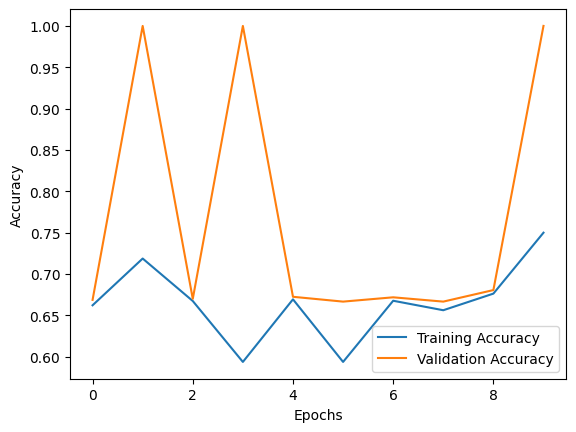

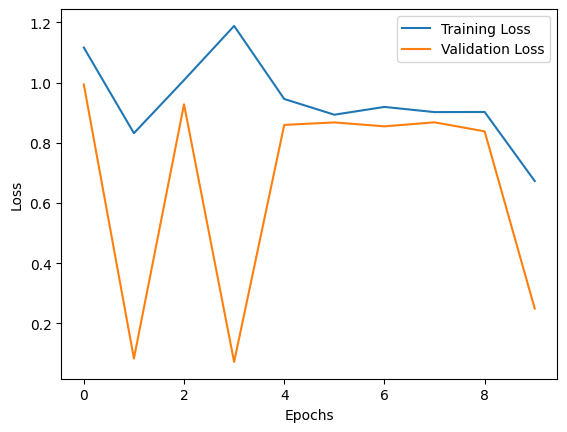

In [20]:
# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


# Experimenting with a pretrained model

In [21]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras import layers, models

# Load the EfficientNetB0 model with pretrained weights
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers
base_model.trainable = False

# Add custom layers on top of the pre-trained model
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(7, activation='softmax')  # 7 classes for skin lesion types
])

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Train the model
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=10,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_steps=val_generator.samples // val_generator.batch_size,
    class_weight=class_weights_dict  # Use class weights
)


Epoch 1/10


2024-12-02 17:01:08.694785: W tensorflow/core/framework/op_kernel.cc:1829] INVALID_ARGUMENT: TypeError: `generator` yielded an element that did not match the expected structure. The expected structure was (tf.float32, tf.float32, tf.float32), but the yielded element was (array([[[[0.7338631 , 0.6093347 , 0.59510547],
         [0.7039801 , 0.53273803, 0.5303703 ],
         [0.725933  , 0.57192093, 0.5947971 ],
         ...,
         [0.56072146, 0.39222   , 0.36868954],
         [0.5596083 , 0.3875518 , 0.36539403],
         [0.5747935 , 0.39833614, 0.37486288]],

        [[0.7274302 , 0.5969206 , 0.5706654 ],
         [0.7262741 , 0.5678212 , 0.55019957],
         [0.73463714, 0.5855566 , 0.5891938 ],
         ...,
         [0.56322056, 0.4040417 , 0.37969956],
         [0.5696364 , 0.41277778, 0.3854852 ],
         [0.5716384 , 0.4072483 , 0.3788867 ]],

        [[0.7195165 , 0.5768023 , 0.5707789 ],
         [0.71119833, 0.560113  , 0.5585419 ],
         [0.72494245, 0.5726943 , 0.57

InvalidArgumentError: Graph execution error:

Detected at node PyFunc defined at (most recent call last):
<stack traces unavailable>
TypeError: `generator` yielded an element that did not match the expected structure. The expected structure was (tf.float32, tf.float32, tf.float32), but the yielded element was (array([[[[0.7338631 , 0.6093347 , 0.59510547],
         [0.7039801 , 0.53273803, 0.5303703 ],
         [0.725933  , 0.57192093, 0.5947971 ],
         ...,
         [0.56072146, 0.39222   , 0.36868954],
         [0.5596083 , 0.3875518 , 0.36539403],
         [0.5747935 , 0.39833614, 0.37486288]],

        [[0.7274302 , 0.5969206 , 0.5706654 ],
         [0.7262741 , 0.5678212 , 0.55019957],
         [0.73463714, 0.5855566 , 0.5891938 ],
         ...,
         [0.56322056, 0.4040417 , 0.37969956],
         [0.5696364 , 0.41277778, 0.3854852 ],
         [0.5716384 , 0.4072483 , 0.3788867 ]],

        [[0.7195165 , 0.5768023 , 0.5707789 ],
         [0.71119833, 0.560113  , 0.5585419 ],
         [0.72494245, 0.5726943 , 0.5758391 ],
         ...,
         [0.5793006 , 0.41858158, 0.3950195 ],
         [0.5826845 , 0.42089373, 0.395044  ],
         [0.58034813, 0.416453  , 0.3874246 ]],

        ...,

        [[0.6893718 , 0.5420008 , 0.5405519 ],
         [0.69003606, 0.54961187, 0.5589596 ],
         [0.70452166, 0.56930786, 0.58295304],
         ...,
         [0.54901963, 0.42352945, 0.427451  ],
         [0.54901963, 0.42352945, 0.427451  ],
         [0.54901963, 0.42352945, 0.427451  ]],

        [[0.68862414, 0.54274845, 0.54354286],
         [0.6937747 , 0.55409825, 0.5649415 ],
         [0.70302624, 0.5700556 , 0.5814576 ],
         ...,
         [0.54901963, 0.42352945, 0.427451  ],
         [0.54901963, 0.42352945, 0.427451  ],
         [0.54901963, 0.42352945, 0.427451  ]],

        [[0.6878764 , 0.5434962 , 0.54653376],
         [0.6975134 , 0.5585847 , 0.5709234 ],
         [0.70153075, 0.57080334, 0.57996213],
         ...,
         [0.54901963, 0.42352945, 0.427451  ],
         [0.54901963, 0.42352945, 0.427451  ],
         [0.54901963, 0.42352945, 0.427451  ]]],


       [[[0.7424261 , 0.5791426 , 0.6377933 ],
         [0.73870933, 0.57792497, 0.632827  ],
         [0.7440421 , 0.56968343, 0.6291102 ],
         ...,
         [0.5258363 , 0.33760095, 0.38892737],
         [0.5233348 , 0.3350995 , 0.3839244 ],
         [0.5219363 , 0.33296567, 0.3800245 ]],

        [[0.74367684, 0.5778918 , 0.6402948 ],
         [0.7399601 , 0.5791757 , 0.6340777 ],
         [0.74028987, 0.57343566, 0.63036096],
         ...,
         [0.52315164, 0.3317504 , 0.3788092 ],
         [0.5244024 , 0.33049965, 0.37755847],
         [0.52581596, 0.32973754, 0.37679636]],

        [[0.7449275 , 0.57664114, 0.6427963 ],
         [0.7412108 , 0.5803579 , 0.63536274],
         [0.73749405, 0.57670975, 0.6316117 ],
         ...,
         [0.5282466 , 0.33216813, 0.37922695],
         [0.53074807, 0.3346696 , 0.38172844],
         [0.53324956, 0.33717105, 0.3842299 ]],

        ...,

        [[0.5988878 , 0.40223888, 0.46498397],
         [0.6038907 , 0.40098813, 0.46373323],
         [0.6067926 , 0.40026265, 0.46300775],
         ...,
         [0.64042807, 0.4286633 , 0.53062415],
         [0.6478616 , 0.43609685, 0.5380577 ],
         [0.6509804 , 0.43921572, 0.5411765 ]],

        [[0.6019315 , 0.40147793, 0.46422306],
         [0.59692854, 0.40272868, 0.4654738 ],
         [0.5920991 , 0.40357462, 0.4664354 ],
         ...,
         [0.6379266 , 0.42616186, 0.52812266],
         [0.6453601 , 0.4335954 , 0.5355562 ],
         [0.6509804 , 0.43921572, 0.5411765 ]],

        [[0.5908838 , 0.39628285, 0.4615742 ],
         [0.58963305, 0.38877845, 0.45657128],
         [0.5883823 , 0.381274  , 0.4515683 ],
         ...,
         [0.6354251 , 0.42366037, 0.5256212 ],
         [0.6428586 , 0.4310939 , 0.5330547 ],
         [0.65029216, 0.43852746, 0.54048824]]],


       [[[0.88020796, 0.46923795, 0.5545412 ],
         [0.8898594 , 0.4718861 , 0.55920494],
         [0.89788884, 0.47794878, 0.5656542 ],
         ...,
         [0.90196085, 0.5647059 , 0.6156863 ],
         [0.90196085, 0.5647059 , 0.6156863 ],
         [0.90196085, 0.5647059 , 0.6156863 ]],

        [[0.8838476 , 0.47635546, 0.55038357],
         [0.8846175 , 0.47693983, 0.55102575],
         [0.8856354 , 0.47844335, 0.5657384 ],
         ...,
         [0.90196085, 0.5647059 , 0.6156863 ],
         [0.90196085, 0.5647059 , 0.6156863 ],
         [0.90196085, 0.5647059 , 0.6156863 ]],

        [[0.87995356, 0.47790706, 0.5421968 ],
         [0.8899479 , 0.47419068, 0.54350036],
         [0.90915495, 0.489865  , 0.56101924],
         ...,
         [0.90196085, 0.5647059 , 0.6156863 ],
         [0.90196085, 0.5647059 , 0.6156863 ],
         [0.90196085, 0.5647059 , 0.6156863 ]],

        ...,

        [[0.8457041 , 0.50844914, 0.5123707 ],
         [0.86203086, 0.51729   , 0.5286975 ],
         [0.8705883 , 0.52884036, 0.53240716],
         ...,
         [0.8083885 , 0.5137255 , 0.5299571 ],
         [0.81211424, 0.5137255 , 0.5336828 ],
         [0.8157171 , 0.51369476, 0.5371935 ]],

        [[0.84644926, 0.5091943 , 0.5131159 ],
         [0.86650175, 0.5195254 , 0.5331684 ],
         [0.8705883 , 0.5310758 , 0.53091687],
         ...,
         [0.8057954 , 0.5137255 , 0.5231996 ],
         [0.80057937, 0.5137255 , 0.520219  ],
         [0.7965893 , 0.5137255 , 0.51815796]],

        [[0.8478719 , 0.5102105 , 0.5145385 ],
         [0.8705883 , 0.5217609 , 0.53712684],
         [0.8705883 , 0.53331125, 0.5294266 ],
         ...,
         [0.82747954, 0.5137255 , 0.5293833 ],
         [0.82524407, 0.5137255 , 0.5316188 ],
         [0.82231414, 0.5137255 , 0.5326389 ]]],


       ...,


       [[[0.87709045, 0.7346237 , 0.911145  ],
         [0.8835268 , 0.7372549 , 0.91292524],
         [0.8841599 , 0.7361976 , 0.92201054],
         ...,
         [0.86450696, 0.69831204, 0.766195  ],
         [0.8692505 , 0.70115817, 0.76809233],
         [0.8705883 , 0.70264196, 0.7672652 ]],

        [[0.87519306, 0.733675  , 0.91304237],
         [0.88257813, 0.7372549 , 0.90723306],
         [0.8860573 , 0.7371463 , 0.9286514 ],
         ...,
         [0.8705883 , 0.7045497 , 0.76344985],
         [0.8705883 , 0.70549834, 0.76155245],
         [0.86945903, 0.7041884 , 0.7607844 ]],

        [[0.87329566, 0.73151207, 0.91069007],
         [0.8809058 , 0.7365314 , 0.9073296 ],
         [0.8854345 , 0.7372549 , 0.9243715 ],
         ...,
         [0.8656436 , 0.69846535, 0.7607844 ],
         [0.86374617, 0.6956193 , 0.7607844 ],
         [0.8609525 , 0.69277316, 0.75719905]],

        ...,

        [[0.8928493 , 0.7216269 , 0.82883584],
         [0.89095193, 0.7187808 , 0.82504106],
         [0.8924793 , 0.72050107, 0.8263835 ],
         ...,
         [0.91646713, 0.6901961 , 0.83331597],
         [0.9126621 , 0.69125956, 0.8196079 ],
         [0.9145389 , 0.69790566, 0.8262368 ]],

        [[0.9001101 , 0.7300396 , 0.83592194],
         [0.90390486, 0.734783  , 0.8406654 ],
         [0.9040652 , 0.7349834 , 0.84086573],
         ...,
         [0.91741586, 0.6901961 , 0.8380594 ],
         [0.91361076, 0.6903109 , 0.8196079 ],
         [0.9098057 , 0.69411594, 0.8196079 ]],

        [[0.8964344 , 0.72544485, 0.83132726],
         [0.8926396 , 0.72070146, 0.8265838 ],
         [0.8898583 , 0.7176471 , 0.8235295 ],
         ...,
         [0.91405994, 0.6873264 , 0.83275884],
         [0.9145594 , 0.6901961 , 0.8237775 ],
         [0.9107544 , 0.69316727, 0.8196079 ]]],


       [[[0.621789  , 0.610465  , 0.66536695],
         [0.6255155 , 0.607742  , 0.66661614],
         [0.6346151 , 0.598209  , 0.6681182 ],
         ...,
         [0.6433847 , 0.57818335, 0.6489194 ],
         [0.6451927 , 0.576402  , 0.6447925 ],
         [0.6453445 , 0.569795  , 0.64460856]],

        [[0.6205676 , 0.60680085, 0.6617028 ],
         [0.6242941 , 0.61262757, 0.6690589 ],
         [0.62972957, 0.5994304 , 0.66445404],
         ...,
         [0.6618265 , 0.5678698 , 0.65114   ],
         [0.6585267 , 0.5749162 , 0.6509804 ],
         [0.6520798 , 0.57002836, 0.6503347 ]],

        [[0.61960787, 0.6033983 , 0.6583003 ],
         [0.62307274, 0.61431617, 0.6692182 ],
         [0.6267993 , 0.6026071 , 0.6640487 ],
         ...,
         [0.66653544, 0.58014274, 0.66168565],
         [0.65890145, 0.5743805 , 0.6553141 ],
         [0.64687014, 0.57156813, 0.65013224]],

        ...,

        [[0.6431373 , 0.5118124 , 0.5383068 ],
         [0.6431373 , 0.5093696 , 0.53464264],
         [0.6431373 , 0.5069268 , 0.53097844],
         ...,
         [0.77631205, 0.6413158 , 0.72923654],
         [0.7760399 , 0.6408565 , 0.72993964],
         [0.77166355, 0.6413831 , 0.7235424 ]],

        [[0.64237577, 0.5051209 , 0.5294118 ],
         [0.64115435, 0.50389946, 0.5294118 ],
         [0.639933  , 0.5026781 , 0.5294118 ],
         ...,
         [0.77202886, 0.64345527, 0.71799296],
         [0.77586436, 0.63770175, 0.7248829 ],
         [0.7750671 , 0.6447462 , 0.73227865]],

        [[0.6409151 , 0.5008279 , 0.52884537],
         [0.6445793 , 0.4983851 , 0.52762395],
         [0.6482434 , 0.49594232, 0.5264026 ],
         ...,
         [0.7733126 , 0.63471854, 0.7295484 ],
         [0.7793991 , 0.6351154 , 0.7358541 ],
         [0.7826869 , 0.6517334 , 0.7387581 ]]],


       [[[0.6509804 , 0.5921569 , 0.7137255 ],
         [0.6509804 , 0.5921569 , 0.7137255 ],
         [0.6509804 , 0.5921569 , 0.7137255 ],
         ...,
         [0.7058824 , 0.6513833 , 0.77958655],
         [0.7038805 , 0.65169895, 0.7717483 ],
         [0.6862745 , 0.62352943, 0.76470596]],

        [[0.6509804 , 0.5921569 , 0.7137255 ],
         [0.6509804 , 0.5921569 , 0.7137255 ],
         [0.6509804 , 0.5921569 , 0.7137255 ],
         ...,
         [0.7058824 , 0.6515218 , 0.7793095 ],
         [0.7031879 , 0.6505908 , 0.77147126],
         [0.6862745 , 0.62352943, 0.76470596]],

        [[0.6509804 , 0.5900564 , 0.707424  ],
         [0.6509804 , 0.59019494, 0.70783955],
         [0.6509804 , 0.59033346, 0.7082551 ],
         ...,
         [0.7058824 , 0.6516603 , 0.77903247],
         [0.7024953 , 0.6494826 , 0.7711942 ],
         [0.6862745 , 0.62352943, 0.76470596]],

        ...,

        [[0.6509804 , 0.59607846, 0.69803923],
         [0.6509804 , 0.59607846, 0.69803923],
         [0.6509804 , 0.59607846, 0.69803923],
         ...,
         [0.68942636, 0.6377215 , 0.730242  ],
         [0.68038625, 0.6499021 , 0.74345165],
         [0.69110984, 0.6707944 , 0.77355945]],

        [[0.6587911 , 0.6007649 , 0.7074121 ],
         [0.6580985 , 0.6003493 , 0.70658094],
         [0.6574059 , 0.59993374, 0.70574987],
         ...,
         [0.68092626, 0.6316748 , 0.7301777 ],
         [0.67328644, 0.65200907, 0.742672  ],
         [0.69289386, 0.6654135 , 0.763006  ]],

        [[0.67058825, 0.60784316, 0.72156864],
         [0.67058825, 0.60784316, 0.72156864],
         [0.67058825, 0.60784316, 0.72156864],
         ...,
         [0.6759992 , 0.6250988 , 0.7314441 ],
         [0.6681409 , 0.6414682 , 0.73413837],
         [0.68956417, 0.65064025, 0.74855393]]]], dtype=float32), array([[1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 1., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0.]], dtype=float32)).
Traceback (most recent call last):

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/data/ops/from_generator_op.py", line 204, in generator_py_func
    flattened_values = nest.flatten_up_to(output_types, values)
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/data/util/nest.py", line 237, in flatten_up_to
    return nest_util.flatten_up_to(
           ^^^^^^^^^^^^^^^^^^^^^^^^

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/util/nest_util.py", line 1541, in flatten_up_to
    return _tf_data_flatten_up_to(shallow_tree, input_tree)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/util/nest_util.py", line 1570, in _tf_data_flatten_up_to
    _tf_data_assert_shallow_structure(shallow_tree, input_tree)

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/util/nest_util.py", line 1427, in _tf_data_assert_shallow_structure
    raise ValueError(

ValueError: The two structures don't have the same sequence length. Input structure has length 2, while shallow structure has length 3.


The above exception was the direct cause of the following exception:


Traceback (most recent call last):

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/ops/script_ops.py", line 269, in __call__
    ret = func(*args)
          ^^^^^^^^^^^

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/autograph/impl/api.py", line 643, in wrapper
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/data/ops/from_generator_op.py", line 206, in generator_py_func
    raise TypeError(

TypeError: `generator` yielded an element that did not match the expected structure. The expected structure was (tf.float32, tf.float32, tf.float32), but the yielded element was (array([[[[0.7338631 , 0.6093347 , 0.59510547],
         [0.7039801 , 0.53273803, 0.5303703 ],
         [0.725933  , 0.57192093, 0.5947971 ],
         ...,
         [0.56072146, 0.39222   , 0.36868954],
         [0.5596083 , 0.3875518 , 0.36539403],
         [0.5747935 , 0.39833614, 0.37486288]],

        [[0.7274302 , 0.5969206 , 0.5706654 ],
         [0.7262741 , 0.5678212 , 0.55019957],
         [0.73463714, 0.5855566 , 0.5891938 ],
         ...,
         [0.56322056, 0.4040417 , 0.37969956],
         [0.5696364 , 0.41277778, 0.3854852 ],
         [0.5716384 , 0.4072483 , 0.3788867 ]],

        [[0.7195165 , 0.5768023 , 0.5707789 ],
         [0.71119833, 0.560113  , 0.5585419 ],
         [0.72494245, 0.5726943 , 0.5758391 ],
         ...,
         [0.5793006 , 0.41858158, 0.3950195 ],
         [0.5826845 , 0.42089373, 0.395044  ],
         [0.58034813, 0.416453  , 0.3874246 ]],

        ...,

        [[0.6893718 , 0.5420008 , 0.5405519 ],
         [0.69003606, 0.54961187, 0.5589596 ],
         [0.70452166, 0.56930786, 0.58295304],
         ...,
         [0.54901963, 0.42352945, 0.427451  ],
         [0.54901963, 0.42352945, 0.427451  ],
         [0.54901963, 0.42352945, 0.427451  ]],

        [[0.68862414, 0.54274845, 0.54354286],
         [0.6937747 , 0.55409825, 0.5649415 ],
         [0.70302624, 0.5700556 , 0.5814576 ],
         ...,
         [0.54901963, 0.42352945, 0.427451  ],
         [0.54901963, 0.42352945, 0.427451  ],
         [0.54901963, 0.42352945, 0.427451  ]],

        [[0.6878764 , 0.5434962 , 0.54653376],
         [0.6975134 , 0.5585847 , 0.5709234 ],
         [0.70153075, 0.57080334, 0.57996213],
         ...,
         [0.54901963, 0.42352945, 0.427451  ],
         [0.54901963, 0.42352945, 0.427451  ],
         [0.54901963, 0.42352945, 0.427451  ]]],


       [[[0.7424261 , 0.5791426 , 0.6377933 ],
         [0.73870933, 0.57792497, 0.632827  ],
         [0.7440421 , 0.56968343, 0.6291102 ],
         ...,
         [0.5258363 , 0.33760095, 0.38892737],
         [0.5233348 , 0.3350995 , 0.3839244 ],
         [0.5219363 , 0.33296567, 0.3800245 ]],

        [[0.74367684, 0.5778918 , 0.6402948 ],
         [0.7399601 , 0.5791757 , 0.6340777 ],
         [0.74028987, 0.57343566, 0.63036096],
         ...,
         [0.52315164, 0.3317504 , 0.3788092 ],
         [0.5244024 , 0.33049965, 0.37755847],
         [0.52581596, 0.32973754, 0.37679636]],

        [[0.7449275 , 0.57664114, 0.6427963 ],
         [0.7412108 , 0.5803579 , 0.63536274],
         [0.73749405, 0.57670975, 0.6316117 ],
         ...,
         [0.5282466 , 0.33216813, 0.37922695],
         [0.53074807, 0.3346696 , 0.38172844],
         [0.53324956, 0.33717105, 0.3842299 ]],

        ...,

        [[0.5988878 , 0.40223888, 0.46498397],
         [0.6038907 , 0.40098813, 0.46373323],
         [0.6067926 , 0.40026265, 0.46300775],
         ...,
         [0.64042807, 0.4286633 , 0.53062415],
         [0.6478616 , 0.43609685, 0.5380577 ],
         [0.6509804 , 0.43921572, 0.5411765 ]],

        [[0.6019315 , 0.40147793, 0.46422306],
         [0.59692854, 0.40272868, 0.4654738 ],
         [0.5920991 , 0.40357462, 0.4664354 ],
         ...,
         [0.6379266 , 0.42616186, 0.52812266],
         [0.6453601 , 0.4335954 , 0.5355562 ],
         [0.6509804 , 0.43921572, 0.5411765 ]],

        [[0.5908838 , 0.39628285, 0.4615742 ],
         [0.58963305, 0.38877845, 0.45657128],
         [0.5883823 , 0.381274  , 0.4515683 ],
         ...,
         [0.6354251 , 0.42366037, 0.5256212 ],
         [0.6428586 , 0.4310939 , 0.5330547 ],
         [0.65029216, 0.43852746, 0.54048824]]],


       [[[0.88020796, 0.46923795, 0.5545412 ],
         [0.8898594 , 0.4718861 , 0.55920494],
         [0.89788884, 0.47794878, 0.5656542 ],
         ...,
         [0.90196085, 0.5647059 , 0.6156863 ],
         [0.90196085, 0.5647059 , 0.6156863 ],
         [0.90196085, 0.5647059 , 0.6156863 ]],

        [[0.8838476 , 0.47635546, 0.55038357],
         [0.8846175 , 0.47693983, 0.55102575],
         [0.8856354 , 0.47844335, 0.5657384 ],
         ...,
         [0.90196085, 0.5647059 , 0.6156863 ],
         [0.90196085, 0.5647059 , 0.6156863 ],
         [0.90196085, 0.5647059 , 0.6156863 ]],

        [[0.87995356, 0.47790706, 0.5421968 ],
         [0.8899479 , 0.47419068, 0.54350036],
         [0.90915495, 0.489865  , 0.56101924],
         ...,
         [0.90196085, 0.5647059 , 0.6156863 ],
         [0.90196085, 0.5647059 , 0.6156863 ],
         [0.90196085, 0.5647059 , 0.6156863 ]],

        ...,

        [[0.8457041 , 0.50844914, 0.5123707 ],
         [0.86203086, 0.51729   , 0.5286975 ],
         [0.8705883 , 0.52884036, 0.53240716],
         ...,
         [0.8083885 , 0.5137255 , 0.5299571 ],
         [0.81211424, 0.5137255 , 0.5336828 ],
         [0.8157171 , 0.51369476, 0.5371935 ]],

        [[0.84644926, 0.5091943 , 0.5131159 ],
         [0.86650175, 0.5195254 , 0.5331684 ],
         [0.8705883 , 0.5310758 , 0.53091687],
         ...,
         [0.8057954 , 0.5137255 , 0.5231996 ],
         [0.80057937, 0.5137255 , 0.520219  ],
         [0.7965893 , 0.5137255 , 0.51815796]],

        [[0.8478719 , 0.5102105 , 0.5145385 ],
         [0.8705883 , 0.5217609 , 0.53712684],
         [0.8705883 , 0.53331125, 0.5294266 ],
         ...,
         [0.82747954, 0.5137255 , 0.5293833 ],
         [0.82524407, 0.5137255 , 0.5316188 ],
         [0.82231414, 0.5137255 , 0.5326389 ]]],


       ...,


       [[[0.87709045, 0.7346237 , 0.911145  ],
         [0.8835268 , 0.7372549 , 0.91292524],
         [0.8841599 , 0.7361976 , 0.92201054],
         ...,
         [0.86450696, 0.69831204, 0.766195  ],
         [0.8692505 , 0.70115817, 0.76809233],
         [0.8705883 , 0.70264196, 0.7672652 ]],

        [[0.87519306, 0.733675  , 0.91304237],
         [0.88257813, 0.7372549 , 0.90723306],
         [0.8860573 , 0.7371463 , 0.9286514 ],
         ...,
         [0.8705883 , 0.7045497 , 0.76344985],
         [0.8705883 , 0.70549834, 0.76155245],
         [0.86945903, 0.7041884 , 0.7607844 ]],

        [[0.87329566, 0.73151207, 0.91069007],
         [0.8809058 , 0.7365314 , 0.9073296 ],
         [0.8854345 , 0.7372549 , 0.9243715 ],
         ...,
         [0.8656436 , 0.69846535, 0.7607844 ],
         [0.86374617, 0.6956193 , 0.7607844 ],
         [0.8609525 , 0.69277316, 0.75719905]],

        ...,

        [[0.8928493 , 0.7216269 , 0.82883584],
         [0.89095193, 0.7187808 , 0.82504106],
         [0.8924793 , 0.72050107, 0.8263835 ],
         ...,
         [0.91646713, 0.6901961 , 0.83331597],
         [0.9126621 , 0.69125956, 0.8196079 ],
         [0.9145389 , 0.69790566, 0.8262368 ]],

        [[0.9001101 , 0.7300396 , 0.83592194],
         [0.90390486, 0.734783  , 0.8406654 ],
         [0.9040652 , 0.7349834 , 0.84086573],
         ...,
         [0.91741586, 0.6901961 , 0.8380594 ],
         [0.91361076, 0.6903109 , 0.8196079 ],
         [0.9098057 , 0.69411594, 0.8196079 ]],

        [[0.8964344 , 0.72544485, 0.83132726],
         [0.8926396 , 0.72070146, 0.8265838 ],
         [0.8898583 , 0.7176471 , 0.8235295 ],
         ...,
         [0.91405994, 0.6873264 , 0.83275884],
         [0.9145594 , 0.6901961 , 0.8237775 ],
         [0.9107544 , 0.69316727, 0.8196079 ]]],


       [[[0.621789  , 0.610465  , 0.66536695],
         [0.6255155 , 0.607742  , 0.66661614],
         [0.6346151 , 0.598209  , 0.6681182 ],
         ...,
         [0.6433847 , 0.57818335, 0.6489194 ],
         [0.6451927 , 0.576402  , 0.6447925 ],
         [0.6453445 , 0.569795  , 0.64460856]],

        [[0.6205676 , 0.60680085, 0.6617028 ],
         [0.6242941 , 0.61262757, 0.6690589 ],
         [0.62972957, 0.5994304 , 0.66445404],
         ...,
         [0.6618265 , 0.5678698 , 0.65114   ],
         [0.6585267 , 0.5749162 , 0.6509804 ],
         [0.6520798 , 0.57002836, 0.6503347 ]],

        [[0.61960787, 0.6033983 , 0.6583003 ],
         [0.62307274, 0.61431617, 0.6692182 ],
         [0.6267993 , 0.6026071 , 0.6640487 ],
         ...,
         [0.66653544, 0.58014274, 0.66168565],
         [0.65890145, 0.5743805 , 0.6553141 ],
         [0.64687014, 0.57156813, 0.65013224]],

        ...,

        [[0.6431373 , 0.5118124 , 0.5383068 ],
         [0.6431373 , 0.5093696 , 0.53464264],
         [0.6431373 , 0.5069268 , 0.53097844],
         ...,
         [0.77631205, 0.6413158 , 0.72923654],
         [0.7760399 , 0.6408565 , 0.72993964],
         [0.77166355, 0.6413831 , 0.7235424 ]],

        [[0.64237577, 0.5051209 , 0.5294118 ],
         [0.64115435, 0.50389946, 0.5294118 ],
         [0.639933  , 0.5026781 , 0.5294118 ],
         ...,
         [0.77202886, 0.64345527, 0.71799296],
         [0.77586436, 0.63770175, 0.7248829 ],
         [0.7750671 , 0.6447462 , 0.73227865]],

        [[0.6409151 , 0.5008279 , 0.52884537],
         [0.6445793 , 0.4983851 , 0.52762395],
         [0.6482434 , 0.49594232, 0.5264026 ],
         ...,
         [0.7733126 , 0.63471854, 0.7295484 ],
         [0.7793991 , 0.6351154 , 0.7358541 ],
         [0.7826869 , 0.6517334 , 0.7387581 ]]],


       [[[0.6509804 , 0.5921569 , 0.7137255 ],
         [0.6509804 , 0.5921569 , 0.7137255 ],
         [0.6509804 , 0.5921569 , 0.7137255 ],
         ...,
         [0.7058824 , 0.6513833 , 0.77958655],
         [0.7038805 , 0.65169895, 0.7717483 ],
         [0.6862745 , 0.62352943, 0.76470596]],

        [[0.6509804 , 0.5921569 , 0.7137255 ],
         [0.6509804 , 0.5921569 , 0.7137255 ],
         [0.6509804 , 0.5921569 , 0.7137255 ],
         ...,
         [0.7058824 , 0.6515218 , 0.7793095 ],
         [0.7031879 , 0.6505908 , 0.77147126],
         [0.6862745 , 0.62352943, 0.76470596]],

        [[0.6509804 , 0.5900564 , 0.707424  ],
         [0.6509804 , 0.59019494, 0.70783955],
         [0.6509804 , 0.59033346, 0.7082551 ],
         ...,
         [0.7058824 , 0.6516603 , 0.77903247],
         [0.7024953 , 0.6494826 , 0.7711942 ],
         [0.6862745 , 0.62352943, 0.76470596]],

        ...,

        [[0.6509804 , 0.59607846, 0.69803923],
         [0.6509804 , 0.59607846, 0.69803923],
         [0.6509804 , 0.59607846, 0.69803923],
         ...,
         [0.68942636, 0.6377215 , 0.730242  ],
         [0.68038625, 0.6499021 , 0.74345165],
         [0.69110984, 0.6707944 , 0.77355945]],

        [[0.6587911 , 0.6007649 , 0.7074121 ],
         [0.6580985 , 0.6003493 , 0.70658094],
         [0.6574059 , 0.59993374, 0.70574987],
         ...,
         [0.68092626, 0.6316748 , 0.7301777 ],
         [0.67328644, 0.65200907, 0.742672  ],
         [0.69289386, 0.6654135 , 0.763006  ]],

        [[0.67058825, 0.60784316, 0.72156864],
         [0.67058825, 0.60784316, 0.72156864],
         [0.67058825, 0.60784316, 0.72156864],
         ...,
         [0.6759992 , 0.6250988 , 0.7314441 ],
         [0.6681409 , 0.6414682 , 0.73413837],
         [0.68956417, 0.65064025, 0.74855393]]]], dtype=float32), array([[1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 1., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0.]], dtype=float32)).


	 [[{{node PyFunc}}]]
	 [[IteratorGetNext]] [Op:__inference_one_step_on_iterator_37968]

, 0.45657128],
         [0.5883823 , 0.381274  , 0.4515683 ],
         ...,
         [0.6354251 , 0.42366037, 0.5256212 ],
         [0.6428586 , 0.4310939 , 0.5330547 ],
         [0.65029216, 0.43852746, 0.54048824]]],


       [[[0.88020796, 0.46923795, 0.5545412 ],
         [0.8898594 , 0.4718861 , 0.55920494],
         [0.89788884, 0.47794878, 0.5656542 ],
         ...,
         [0.90196085, 0.5647059 , 0.6156863 ],
         [0.90196085, 0.5647059 , 0.6156863 ],
         [0.90196085, 0.5647059 , 0.6156863 ]],

        [[0.8838476 , 0.47635546, 0.55038357],
         [0.8846175 , 0.47693983, 0.55102575],
         [0.8856354 , 0.47844335, 0.5657384 ],
         ...,
         [0.90196085, 0.5647059 , 0.6156863 ],
         [0.90196085, 0.5647059 , 0.6156863 ],
         [0.90196085, 0.5647059 , 0.6156863 ]],

        [[0.87995356, 0.47790706, 0.5421968 ],
         [0.8899479 , 0.47419068, 0.54350036],
         [0.90915495, 0.489865  , 0.56101924],
         ...,
         [0.90196085, 0.5647

In [22]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Generate predictions
y_true = test_generator.classes
y_pred = np.argmax(model.predict(test_generator), axis=1)

# Classification report
print(classification_report(y_true, y_pred, target_names=test_generator.class_indices.keys()))

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)
print("Confusion Matrix:\n", cm)


63/63 ━━━━━━━━━━━━━━━━━━━━ 22s 329ms/step
              precision    recall  f1-score   support

       akiec       0.03      1.00      0.06        65
         bcc       0.00      0.00      0.00       103
         bkl       0.00      0.00      0.00       220
          df       0.00      0.00      0.00        23
         mel       0.00      0.00      0.00       223
          nv       0.00      0.00      0.00      1341
        vasc       0.00      0.00      0.00        28

    accuracy                           0.03      2003
   macro avg       0.00      0.14      0.01      2003
weighted avg       0.00      0.03      0.00      2003

Confusion Matrix:
 [[  65    0    0    0    0    0    0]
 [ 103    0    0    0    0    0    0]
 [ 220    0    0    0    0    0    0]
 [  23    0    0    0    0    0    0]
 [ 223    0    0    0    0    0    0]
 [1341    0    0    0    0    0    0]
 [  28    0    0    0    0    0    0]]


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model

def grad_cam(model, img_array, layer_name):
    grad_model = Model(inputs=model.input, outputs=[model.get_layer(layer_name).output, model.output])
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions[0])]
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs.numpy()[0]
    pooled_grads = pooled_grads.numpy()
    for i in range(pooled_grads.shape[-1]):
        conv_outputs[:, :, i] *= pooled_grads[i]
    heatmap = np.mean(conv_outputs, axis=-1)
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
    return heatmap


# Model is performing poorly so let's fine tune

In [24]:
# Example: Augmenting minority classes
minority_classes = ['akiec', 'bcc', 'mel', 'df', 'vasc']
augmented_data = metadata[metadata['dx'].isin(minority_classes)].copy()
augmented_data = augmented_data.sample(frac=2, replace=True)  # Oversample 2x
metadata_balanced = pd.concat([metadata, augmented_data], axis=0)


In [25]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam

# Load the EfficientNetB0 base model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers
base_model.trainable = False

# Build the transfer learning model
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),  # Custom dense layer
    layers.Dropout(0.5),  # Regularization
    layers.Dense(7, activation='softmax')  # Output layer for 7 classes
])

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Display the model summary
model.summary()


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,214,442 (16.08 MB)

 Trainable params: 164,871 (644.03 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [26]:
# Unfreeze the base model layers
base_model.trainable = True

# Compile the model with a lower learning rate for fine-tuning
model.compile(
    optimizer=Adam(learning_rate=0.00001),  # Lower learning rate
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Fine-tune the model
history_fine_tune = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=10,  # Additional 10 epochs for fine-tuning
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_steps=val_generator.samples // val_generator.batch_size,
    class_weight=class_weights_dict
)


Epoch 1/10


2024-12-02 17:02:30.973114: W tensorflow/core/framework/op_kernel.cc:1829] INVALID_ARGUMENT: TypeError: `generator` yielded an element that did not match the expected structure. The expected structure was (tf.float32, tf.float32, tf.float32), but the yielded element was (array([[[[0.7416471 , 0.47777265, 0.4402197 ],
         [0.7078481 , 0.442161  , 0.41665602],
         [0.6752609 , 0.40587792, 0.40843683],
         ...,
         [0.92672706, 0.7463349 , 0.7463349 ],
         [0.92396134, 0.74356914, 0.74356914],
         [0.921814  , 0.7414219 , 0.7414219 ]],

        [[0.7523837 , 0.48958284, 0.4541772 ],
         [0.71466637, 0.44809377, 0.4051447 ],
         [0.6916596 , 0.42867061, 0.45173103],
         ...,
         [0.9185652 , 0.73817307, 0.73817307],
         [0.9244079 , 0.74155724, 0.7421719 ],
         [0.9362181 , 0.74907285, 0.75076115]],

        [[0.72342205, 0.44948003, 0.4009532 ],
         [0.72540295, 0.45990396, 0.41910216],
         [0.6981015 , 0.43403888, 0.43

InvalidArgumentError: Graph execution error:

Detected at node PyFunc defined at (most recent call last):
<stack traces unavailable>
TypeError: `generator` yielded an element that did not match the expected structure. The expected structure was (tf.float32, tf.float32, tf.float32), but the yielded element was (array([[[[0.7416471 , 0.47777265, 0.4402197 ],
         [0.7078481 , 0.442161  , 0.41665602],
         [0.6752609 , 0.40587792, 0.40843683],
         ...,
         [0.92672706, 0.7463349 , 0.7463349 ],
         [0.92396134, 0.74356914, 0.74356914],
         [0.921814  , 0.7414219 , 0.7414219 ]],

        [[0.7523837 , 0.48958284, 0.4541772 ],
         [0.71466637, 0.44809377, 0.4051447 ],
         [0.6916596 , 0.42867061, 0.45173103],
         ...,
         [0.9185652 , 0.73817307, 0.73817307],
         [0.9244079 , 0.74155724, 0.7421719 ],
         [0.9362181 , 0.74907285, 0.75076115]],

        [[0.72342205, 0.44948003, 0.4009532 ],
         [0.72540295, 0.45990396, 0.41910216],
         [0.6981015 , 0.43403888, 0.43777353],
         ...,
         [0.9540867 , 0.7604438 , 0.76375645],
         [0.9533479 , 0.7595933 , 0.7607263 ],
         [0.93616945, 0.7477831 , 0.74247414]],

        ...,

        [[0.77344775, 0.5186581 , 0.6131128 ],
         [0.78023964, 0.5311056 , 0.62137794],
         [0.78882885, 0.54613674, 0.63211447],
         ...,
         [0.883622  , 0.6772196 , 0.7868518 ],
         [0.88078433, 0.68549037, 0.7729413 ],
         [0.8842214 , 0.67758965, 0.7667591 ]],

        [[0.8018242 , 0.56887865, 0.6483587 ],
         [0.80148715, 0.5676802 , 0.646923  ],
         [0.79826623, 0.5612382 , 0.6415548 ],
         ...,
         [0.88576937, 0.6718514 , 0.7911464 ],
         [0.87863696, 0.68978494, 0.77616227],
         [0.88618046, 0.67469805, 0.7648471 ]],

        [[0.79339296, 0.5514917 , 0.6334326 ],
         [0.7954651 , 0.55166626, 0.63798904],
         [0.8008334 , 0.55596083, 0.6487256 ],
         ...,
         [0.8813484 , 0.6664831 , 0.7839465 ],
         [0.8803732 , 0.6853418 , 0.78035414],
         [0.88403314, 0.6789927 , 0.7680681 ]]],


       [[[0.8415961 , 0.54778665, 0.59876704],
         [0.83293426, 0.5408572 , 0.5918376 ],
         [0.8242724 , 0.53392774, 0.5849081 ],
         ...,
         [0.8828673 , 0.5318731 , 0.6343206 ],
         [0.87626064, 0.54334724, 0.63529414],
         [0.87126875, 0.5288926 , 0.62557083]],

        [[0.86616474, 0.5664157 , 0.6122667 ],
         [0.8644324 , 0.5655495 , 0.61399907],
         [0.86251956, 0.5645254 , 0.6155058 ],
         ...,
         [0.88513625, 0.5344717 , 0.63529414],
         [0.8742273 , 0.5436852 , 0.63444644],
         [0.8700311 , 0.5253045 , 0.6233437 ]],

        [[0.8560717 , 0.55411094, 0.5933266 ],
         [0.86386734, 0.5619066 , 0.60112226],
         [0.87034947, 0.568508  , 0.608082  ],
         ...,
         [0.8825377 , 0.5370702 , 0.63529414],
         [0.87336105, 0.5393543 , 0.63184786],
         [0.8674326 , 0.5244383 , 0.62247753]],

        ...,

        [[0.8493788 , 0.56978744, 0.5938968 ],
         [0.8603295 , 0.57502127, 0.60102284],
         [0.8442961 , 0.5666373 , 0.58193725],
         ...,
         [0.79267496, 0.5200888 , 0.5198669 ],
         [0.7883616 , 0.52118987, 0.51789963],
         [0.7892278 , 0.51859134, 0.5196319 ]],

        [[0.8528435 , 0.57151985, 0.5964954 ],
         [0.85599864, 0.57242274, 0.5958258 ],
         [0.8468947 , 0.5709682 , 0.58540195],
         ...,
         [0.8117648 , 0.5111532 , 0.531341  ],
         [0.8104261 , 0.5141717 , 0.52874243],
         [0.805229  , 0.5159041 , 0.5261439 ]],

        [[0.8563082 , 0.57325214, 0.5990939 ],
         [0.85166776, 0.5698242 , 0.5906287 ],
         [0.8494932 , 0.575299  , 0.5888668 ],
         ...,
         [0.8079412 , 0.49585438, 0.5373529 ],
         [0.8117648 , 0.4993191 , 0.5402166 ],
         [0.8117648 , 0.50278383, 0.5376181 ]]],


       [[[0.67541176, 0.5534566 , 0.5856023 ],
         [0.7015868 , 0.5688768 , 0.6226567 ],
         [0.6903166 , 0.57659113, 0.59607846],
         ...,
         [0.5294118 , 0.4039216 , 0.40784317],
         [0.5294118 , 0.4039216 , 0.40784317],
         [0.5294118 , 0.4039216 , 0.40784317]],

        [[0.6766769 , 0.55417955, 0.5874096 ],
         [0.70104456, 0.5692383 , 0.62139153],
         [0.69049734, 0.57677186, 0.59607846],
         ...,
         [0.5294118 , 0.4039216 , 0.40784317],
         [0.5294118 , 0.4039216 , 0.40784317],
         [0.5294118 , 0.4039216 , 0.40784317]],

        [[0.6779421 , 0.5549025 , 0.589217  ],
         [0.7005024 , 0.5695998 , 0.62012637],
         [0.6906781 , 0.57695264, 0.59607846],
         ...,
         [0.5294118 , 0.4039216 , 0.40784317],
         [0.5294118 , 0.4039216 , 0.40784317],
         [0.5294118 , 0.4039216 , 0.40784317]],

        ...,

        [[0.6724659 , 0.5527593 , 0.5790814 ],
         [0.6802241 , 0.5711542 , 0.59590113],
         [0.6740242 , 0.5567082 , 0.5819253 ],
         ...,
         [0.5096911 , 0.4077303 , 0.41422865],
         [0.5107755 , 0.40881473, 0.4156745 ],
         [0.51185995, 0.40989915, 0.41712043]],

        [[0.6687914 , 0.5513692 , 0.58347934],
         [0.66998893, 0.5595337 , 0.5946143 ],
         [0.684229  , 0.562361  , 0.60060954],
         ...,
         [0.49407375, 0.39211297, 0.39603454],
         [0.49461594, 0.39265516, 0.39657673],
         [0.49515817, 0.3931974 , 0.39711896]],

        [[0.64717436, 0.53047514, 0.56306505],
         [0.66483295, 0.55288464, 0.59452933],
         [0.6628078 , 0.54157954, 0.59639144],
         ...,
         [0.48757127, 0.38561046, 0.38428232],
         [0.487752  , 0.38579118, 0.3848245 ],
         [0.4879327 , 0.38597193, 0.38536674]]],


       ...,


       [[[0.15277715, 0.10575113, 0.18408407],
         [0.18385102, 0.1367922 , 0.19204119],
         [0.20350723, 0.14493231, 0.23438257],
         ...,
         [0.04705883, 0.00784314, 0.04313726],
         [0.04705883, 0.00784314, 0.04313726],
         [0.04705883, 0.00784314, 0.04313726]],

        [[0.15056528, 0.10398164, 0.18098746],
         [0.18031204, 0.13325322, 0.19115645],
         [0.20129536, 0.14404756, 0.22951646],
         ...,
         [0.04405636, 0.00784314, 0.04213643],
         [0.04272924, 0.00784314, 0.04169406],
         [0.04140212, 0.00784314, 0.04125169]],

        [[0.14835343, 0.10221214, 0.17789087],
         [0.17677306, 0.12971422, 0.1902717 ],
         [0.19908349, 0.14316282, 0.22465035],
         ...,
         [0.03139095, 0.00881893, 0.0372641 ],
         [0.02962146, 0.0092613 , 0.03637936],
         [0.02785197, 0.00970368, 0.03549461]],

        ...,

        [[0.02683163, 0.00758212, 0.03618538],
         [0.02723409, 0.00392157, 0.04943569],
         [0.02385686, 0.00392157, 0.02816164],
         ...,
         [0.0509804 , 0.01960784, 0.0627451 ],
         [0.0509804 , 0.01960784, 0.0627451 ],
         [0.0509804 , 0.01960784, 0.0627451 ]],

        [[0.03837781, 0.00764268, 0.049424  ],
         [0.02851477, 0.00414086, 0.04347437],
         [0.02443538, 0.00443647, 0.03208896],
         ...,
         [0.0509804 , 0.01960784, 0.0627451 ],
         [0.0509804 , 0.01960784, 0.0627451 ],
         [0.0509804 , 0.01960784, 0.0627451 ]],

        [[0.02742145, 0.0048062 , 0.04379776],
         [0.04001403, 0.00392157, 0.03989762],
         [0.03173444, 0.00628575, 0.03362282],
         ...,
         [0.0509804 , 0.01960784, 0.0627451 ],
         [0.0509804 , 0.01960784, 0.0627451 ],
         [0.0509804 , 0.01960784, 0.0627451 ]]],


       [[[0.76470596, 0.44705886, 0.48235297],
         [0.76470596, 0.44705886, 0.48235297],
         [0.76470596, 0.44705886, 0.48235297],
         ...,
         [0.8941825 , 0.54526013, 0.56869227],
         [0.8941177 , 0.5567654 , 0.56084925],
         [0.9096739 , 0.576308  , 0.5646734 ]],

        [[0.76470596, 0.44705886, 0.48235297],
         [0.76470596, 0.44705886, 0.48235297],
         [0.76470596, 0.44705886, 0.48235297],
         ...,
         [0.89422154, 0.5453575 , 0.5687313 ],
         [0.8941177 , 0.55670696, 0.56088823],
         [0.90959597, 0.5762107 , 0.56465393]],

        [[0.76470596, 0.44705886, 0.48235297],
         [0.76470596, 0.44705886, 0.48235297],
         [0.76470596, 0.44705886, 0.48235297],
         ...,
         [0.89426047, 0.5454549 , 0.56877023],
         [0.8941177 , 0.5566485 , 0.56092715],
         [0.90951806, 0.5761133 , 0.56463444]],

        ...,

        [[0.8711346 , 0.60574585, 0.5948005 ],
         [0.8712125 , 0.6057263 , 0.5948979 ],
         [0.8712904 , 0.6057069 , 0.5949953 ],
         ...,
         [0.8129032 , 0.45381013, 0.49875784],
         [0.8116887 , 0.46488604, 0.50108504],
         [0.8107349 , 0.47837535, 0.5201742 ]],

        [[0.8700422 , 0.599727  , 0.5934351 ],
         [0.8699643 , 0.59968805, 0.5933377 ],
         [0.8698864 , 0.5996491 , 0.59324026],
         ...,
         [0.81830096, 0.46316358, 0.5031169 ],
         [0.81389934, 0.47348058, 0.51349795],
         [0.8151547 , 0.48023567, 0.5300332 ]],

        [[0.86064786, 0.59188396, 0.5759247 ],
         [0.8606284 , 0.59184504, 0.5758468 ],
         [0.86060894, 0.59180605, 0.5757689 ],
         ...,
         [0.8150081 , 0.45664984, 0.50356853],
         [0.8187254 , 0.47022837, 0.5093606 ],
         [0.82180244, 0.4744677 , 0.5217252 ]]],


       [[[0.55818135, 0.4875931 , 0.5433514 ],
         [0.5697745 , 0.49918628, 0.5462451 ],
         [0.5764706 , 0.5091471 , 0.55457354],
         ...,
         [0.16862746, 0.16078432, 0.18039216],
         [0.16862746, 0.16078432, 0.18039216],
         [0.16862746, 0.16078432, 0.18039216]],

        [[0.560183  , 0.48959473, 0.54268414],
         [0.57177615, 0.5011879 , 0.54824674],
         [0.5764706 , 0.5104815 , 0.5552408 ],
         ...,
         [0.16862746, 0.16078432, 0.18039216],
         [0.16862746, 0.16078432, 0.18039216],
         [0.16862746, 0.16078432, 0.18039216]],

        [[0.56218463, 0.49159637, 0.5420169 ],
         [0.57377785, 0.5031896 , 0.55024844],
         [0.5764706 , 0.51181597, 0.555908  ],
         ...,
         [0.16862746, 0.16078432, 0.18039216],
         [0.16862746, 0.16078432, 0.18039216],
         [0.16862746, 0.16078432, 0.18039216]],

        ...,

        [[0.8823735 , 0.8235842 , 0.8927574 ],
         [0.8963498 , 0.8048749 , 0.8903895 ],
         [0.8973325 , 0.81668884, 0.8925592 ],
         ...,
         [0.6583578 , 0.5755    , 0.6799069 ],
         [0.6616939 , 0.57683444, 0.6805741 ],
         [0.66502994, 0.5781688 , 0.68124133]],

        [[0.88566214, 0.8235032 , 0.90090877],
         [0.86963606, 0.8115012 , 0.8918061 ],
         [0.8818798 , 0.79860604, 0.88612074],
         ...,
         [0.64620256, 0.56538224, 0.68082035],
         [0.64753705, 0.56738394, 0.68015313],
         [0.6488714 , 0.5693856 , 0.67948586]],

        [[0.879004  , 0.8184048 , 0.89891225],
         [0.88497245, 0.82259166, 0.8921621 ],
         [0.8853025 , 0.8108967 , 0.89107096],
         ...,
         [0.6384738 , 0.5631161 , 0.6683625 ],
         [0.63980824, 0.56244886, 0.67236584],
         [0.64114267, 0.56178164, 0.6763691 ]]]], dtype=float32), array([[0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.]], dtype=float32)).
Traceback (most recent call last):

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/data/ops/from_generator_op.py", line 204, in generator_py_func
    flattened_values = nest.flatten_up_to(output_types, values)
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/data/util/nest.py", line 237, in flatten_up_to
    return nest_util.flatten_up_to(
           ^^^^^^^^^^^^^^^^^^^^^^^^

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/util/nest_util.py", line 1541, in flatten_up_to
    return _tf_data_flatten_up_to(shallow_tree, input_tree)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/util/nest_util.py", line 1570, in _tf_data_flatten_up_to
    _tf_data_assert_shallow_structure(shallow_tree, input_tree)

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/util/nest_util.py", line 1427, in _tf_data_assert_shallow_structure
    raise ValueError(

ValueError: The two structures don't have the same sequence length. Input structure has length 2, while shallow structure has length 3.


The above exception was the direct cause of the following exception:


Traceback (most recent call last):

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/ops/script_ops.py", line 269, in __call__
    ret = func(*args)
          ^^^^^^^^^^^

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/autograph/impl/api.py", line 643, in wrapper
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/data/ops/from_generator_op.py", line 206, in generator_py_func
    raise TypeError(

TypeError: `generator` yielded an element that did not match the expected structure. The expected structure was (tf.float32, tf.float32, tf.float32), but the yielded element was (array([[[[0.7416471 , 0.47777265, 0.4402197 ],
         [0.7078481 , 0.442161  , 0.41665602],
         [0.6752609 , 0.40587792, 0.40843683],
         ...,
         [0.92672706, 0.7463349 , 0.7463349 ],
         [0.92396134, 0.74356914, 0.74356914],
         [0.921814  , 0.7414219 , 0.7414219 ]],

        [[0.7523837 , 0.48958284, 0.4541772 ],
         [0.71466637, 0.44809377, 0.4051447 ],
         [0.6916596 , 0.42867061, 0.45173103],
         ...,
         [0.9185652 , 0.73817307, 0.73817307],
         [0.9244079 , 0.74155724, 0.7421719 ],
         [0.9362181 , 0.74907285, 0.75076115]],

        [[0.72342205, 0.44948003, 0.4009532 ],
         [0.72540295, 0.45990396, 0.41910216],
         [0.6981015 , 0.43403888, 0.43777353],
         ...,
         [0.9540867 , 0.7604438 , 0.76375645],
         [0.9533479 , 0.7595933 , 0.7607263 ],
         [0.93616945, 0.7477831 , 0.74247414]],

        ...,

        [[0.77344775, 0.5186581 , 0.6131128 ],
         [0.78023964, 0.5311056 , 0.62137794],
         [0.78882885, 0.54613674, 0.63211447],
         ...,
         [0.883622  , 0.6772196 , 0.7868518 ],
         [0.88078433, 0.68549037, 0.7729413 ],
         [0.8842214 , 0.67758965, 0.7667591 ]],

        [[0.8018242 , 0.56887865, 0.6483587 ],
         [0.80148715, 0.5676802 , 0.646923  ],
         [0.79826623, 0.5612382 , 0.6415548 ],
         ...,
         [0.88576937, 0.6718514 , 0.7911464 ],
         [0.87863696, 0.68978494, 0.77616227],
         [0.88618046, 0.67469805, 0.7648471 ]],

        [[0.79339296, 0.5514917 , 0.6334326 ],
         [0.7954651 , 0.55166626, 0.63798904],
         [0.8008334 , 0.55596083, 0.6487256 ],
         ...,
         [0.8813484 , 0.6664831 , 0.7839465 ],
         [0.8803732 , 0.6853418 , 0.78035414],
         [0.88403314, 0.6789927 , 0.7680681 ]]],


       [[[0.8415961 , 0.54778665, 0.59876704],
         [0.83293426, 0.5408572 , 0.5918376 ],
         [0.8242724 , 0.53392774, 0.5849081 ],
         ...,
         [0.8828673 , 0.5318731 , 0.6343206 ],
         [0.87626064, 0.54334724, 0.63529414],
         [0.87126875, 0.5288926 , 0.62557083]],

        [[0.86616474, 0.5664157 , 0.6122667 ],
         [0.8644324 , 0.5655495 , 0.61399907],
         [0.86251956, 0.5645254 , 0.6155058 ],
         ...,
         [0.88513625, 0.5344717 , 0.63529414],
         [0.8742273 , 0.5436852 , 0.63444644],
         [0.8700311 , 0.5253045 , 0.6233437 ]],

        [[0.8560717 , 0.55411094, 0.5933266 ],
         [0.86386734, 0.5619066 , 0.60112226],
         [0.87034947, 0.568508  , 0.608082  ],
         ...,
         [0.8825377 , 0.5370702 , 0.63529414],
         [0.87336105, 0.5393543 , 0.63184786],
         [0.8674326 , 0.5244383 , 0.62247753]],

        ...,

        [[0.8493788 , 0.56978744, 0.5938968 ],
         [0.8603295 , 0.57502127, 0.60102284],
         [0.8442961 , 0.5666373 , 0.58193725],
         ...,
         [0.79267496, 0.5200888 , 0.5198669 ],
         [0.7883616 , 0.52118987, 0.51789963],
         [0.7892278 , 0.51859134, 0.5196319 ]],

        [[0.8528435 , 0.57151985, 0.5964954 ],
         [0.85599864, 0.57242274, 0.5958258 ],
         [0.8468947 , 0.5709682 , 0.58540195],
         ...,
         [0.8117648 , 0.5111532 , 0.531341  ],
         [0.8104261 , 0.5141717 , 0.52874243],
         [0.805229  , 0.5159041 , 0.5261439 ]],

        [[0.8563082 , 0.57325214, 0.5990939 ],
         [0.85166776, 0.5698242 , 0.5906287 ],
         [0.8494932 , 0.575299  , 0.5888668 ],
         ...,
         [0.8079412 , 0.49585438, 0.5373529 ],
         [0.8117648 , 0.4993191 , 0.5402166 ],
         [0.8117648 , 0.50278383, 0.5376181 ]]],


       [[[0.67541176, 0.5534566 , 0.5856023 ],
         [0.7015868 , 0.5688768 , 0.6226567 ],
         [0.6903166 , 0.57659113, 0.59607846],
         ...,
         [0.5294118 , 0.4039216 , 0.40784317],
         [0.5294118 , 0.4039216 , 0.40784317],
         [0.5294118 , 0.4039216 , 0.40784317]],

        [[0.6766769 , 0.55417955, 0.5874096 ],
         [0.70104456, 0.5692383 , 0.62139153],
         [0.69049734, 0.57677186, 0.59607846],
         ...,
         [0.5294118 , 0.4039216 , 0.40784317],
         [0.5294118 , 0.4039216 , 0.40784317],
         [0.5294118 , 0.4039216 , 0.40784317]],

        [[0.6779421 , 0.5549025 , 0.589217  ],
         [0.7005024 , 0.5695998 , 0.62012637],
         [0.6906781 , 0.57695264, 0.59607846],
         ...,
         [0.5294118 , 0.4039216 , 0.40784317],
         [0.5294118 , 0.4039216 , 0.40784317],
         [0.5294118 , 0.4039216 , 0.40784317]],

        ...,

        [[0.6724659 , 0.5527593 , 0.5790814 ],
         [0.6802241 , 0.5711542 , 0.59590113],
         [0.6740242 , 0.5567082 , 0.5819253 ],
         ...,
         [0.5096911 , 0.4077303 , 0.41422865],
         [0.5107755 , 0.40881473, 0.4156745 ],
         [0.51185995, 0.40989915, 0.41712043]],

        [[0.6687914 , 0.5513692 , 0.58347934],
         [0.66998893, 0.5595337 , 0.5946143 ],
         [0.684229  , 0.562361  , 0.60060954],
         ...,
         [0.49407375, 0.39211297, 0.39603454],
         [0.49461594, 0.39265516, 0.39657673],
         [0.49515817, 0.3931974 , 0.39711896]],

        [[0.64717436, 0.53047514, 0.56306505],
         [0.66483295, 0.55288464, 0.59452933],
         [0.6628078 , 0.54157954, 0.59639144],
         ...,
         [0.48757127, 0.38561046, 0.38428232],
         [0.487752  , 0.38579118, 0.3848245 ],
         [0.4879327 , 0.38597193, 0.38536674]]],


       ...,


       [[[0.15277715, 0.10575113, 0.18408407],
         [0.18385102, 0.1367922 , 0.19204119],
         [0.20350723, 0.14493231, 0.23438257],
         ...,
         [0.04705883, 0.00784314, 0.04313726],
         [0.04705883, 0.00784314, 0.04313726],
         [0.04705883, 0.00784314, 0.04313726]],

        [[0.15056528, 0.10398164, 0.18098746],
         [0.18031204, 0.13325322, 0.19115645],
         [0.20129536, 0.14404756, 0.22951646],
         ...,
         [0.04405636, 0.00784314, 0.04213643],
         [0.04272924, 0.00784314, 0.04169406],
         [0.04140212, 0.00784314, 0.04125169]],

        [[0.14835343, 0.10221214, 0.17789087],
         [0.17677306, 0.12971422, 0.1902717 ],
         [0.19908349, 0.14316282, 0.22465035],
         ...,
         [0.03139095, 0.00881893, 0.0372641 ],
         [0.02962146, 0.0092613 , 0.03637936],
         [0.02785197, 0.00970368, 0.03549461]],

        ...,

        [[0.02683163, 0.00758212, 0.03618538],
         [0.02723409, 0.00392157, 0.04943569],
         [0.02385686, 0.00392157, 0.02816164],
         ...,
         [0.0509804 , 0.01960784, 0.0627451 ],
         [0.0509804 , 0.01960784, 0.0627451 ],
         [0.0509804 , 0.01960784, 0.0627451 ]],

        [[0.03837781, 0.00764268, 0.049424  ],
         [0.02851477, 0.00414086, 0.04347437],
         [0.02443538, 0.00443647, 0.03208896],
         ...,
         [0.0509804 , 0.01960784, 0.0627451 ],
         [0.0509804 , 0.01960784, 0.0627451 ],
         [0.0509804 , 0.01960784, 0.0627451 ]],

        [[0.02742145, 0.0048062 , 0.04379776],
         [0.04001403, 0.00392157, 0.03989762],
         [0.03173444, 0.00628575, 0.03362282],
         ...,
         [0.0509804 , 0.01960784, 0.0627451 ],
         [0.0509804 , 0.01960784, 0.0627451 ],
         [0.0509804 , 0.01960784, 0.0627451 ]]],


       [[[0.76470596, 0.44705886, 0.48235297],
         [0.76470596, 0.44705886, 0.48235297],
         [0.76470596, 0.44705886, 0.48235297],
         ...,
         [0.8941825 , 0.54526013, 0.56869227],
         [0.8941177 , 0.5567654 , 0.56084925],
         [0.9096739 , 0.576308  , 0.5646734 ]],

        [[0.76470596, 0.44705886, 0.48235297],
         [0.76470596, 0.44705886, 0.48235297],
         [0.76470596, 0.44705886, 0.48235297],
         ...,
         [0.89422154, 0.5453575 , 0.5687313 ],
         [0.8941177 , 0.55670696, 0.56088823],
         [0.90959597, 0.5762107 , 0.56465393]],

        [[0.76470596, 0.44705886, 0.48235297],
         [0.76470596, 0.44705886, 0.48235297],
         [0.76470596, 0.44705886, 0.48235297],
         ...,
         [0.89426047, 0.5454549 , 0.56877023],
         [0.8941177 , 0.5566485 , 0.56092715],
         [0.90951806, 0.5761133 , 0.56463444]],

        ...,

        [[0.8711346 , 0.60574585, 0.5948005 ],
         [0.8712125 , 0.6057263 , 0.5948979 ],
         [0.8712904 , 0.6057069 , 0.5949953 ],
         ...,
         [0.8129032 , 0.45381013, 0.49875784],
         [0.8116887 , 0.46488604, 0.50108504],
         [0.8107349 , 0.47837535, 0.5201742 ]],

        [[0.8700422 , 0.599727  , 0.5934351 ],
         [0.8699643 , 0.59968805, 0.5933377 ],
         [0.8698864 , 0.5996491 , 0.59324026],
         ...,
         [0.81830096, 0.46316358, 0.5031169 ],
         [0.81389934, 0.47348058, 0.51349795],
         [0.8151547 , 0.48023567, 0.5300332 ]],

        [[0.86064786, 0.59188396, 0.5759247 ],
         [0.8606284 , 0.59184504, 0.5758468 ],
         [0.86060894, 0.59180605, 0.5757689 ],
         ...,
         [0.8150081 , 0.45664984, 0.50356853],
         [0.8187254 , 0.47022837, 0.5093606 ],
         [0.82180244, 0.4744677 , 0.5217252 ]]],


       [[[0.55818135, 0.4875931 , 0.5433514 ],
         [0.5697745 , 0.49918628, 0.5462451 ],
         [0.5764706 , 0.5091471 , 0.55457354],
         ...,
         [0.16862746, 0.16078432, 0.18039216],
         [0.16862746, 0.16078432, 0.18039216],
         [0.16862746, 0.16078432, 0.18039216]],

        [[0.560183  , 0.48959473, 0.54268414],
         [0.57177615, 0.5011879 , 0.54824674],
         [0.5764706 , 0.5104815 , 0.5552408 ],
         ...,
         [0.16862746, 0.16078432, 0.18039216],
         [0.16862746, 0.16078432, 0.18039216],
         [0.16862746, 0.16078432, 0.18039216]],

        [[0.56218463, 0.49159637, 0.5420169 ],
         [0.57377785, 0.5031896 , 0.55024844],
         [0.5764706 , 0.51181597, 0.555908  ],
         ...,
         [0.16862746, 0.16078432, 0.18039216],
         [0.16862746, 0.16078432, 0.18039216],
         [0.16862746, 0.16078432, 0.18039216]],

        ...,

        [[0.8823735 , 0.8235842 , 0.8927574 ],
         [0.8963498 , 0.8048749 , 0.8903895 ],
         [0.8973325 , 0.81668884, 0.8925592 ],
         ...,
         [0.6583578 , 0.5755    , 0.6799069 ],
         [0.6616939 , 0.57683444, 0.6805741 ],
         [0.66502994, 0.5781688 , 0.68124133]],

        [[0.88566214, 0.8235032 , 0.90090877],
         [0.86963606, 0.8115012 , 0.8918061 ],
         [0.8818798 , 0.79860604, 0.88612074],
         ...,
         [0.64620256, 0.56538224, 0.68082035],
         [0.64753705, 0.56738394, 0.68015313],
         [0.6488714 , 0.5693856 , 0.67948586]],

        [[0.879004  , 0.8184048 , 0.89891225],
         [0.88497245, 0.82259166, 0.8921621 ],
         [0.8853025 , 0.8108967 , 0.89107096],
         ...,
         [0.6384738 , 0.5631161 , 0.6683625 ],
         [0.63980824, 0.56244886, 0.67236584],
         [0.64114267, 0.56178164, 0.6763691 ]]]], dtype=float32), array([[0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.]], dtype=float32)).


	 [[{{node PyFunc}}]]
	 [[IteratorGetNext]] [Op:__inference_one_step_on_iterator_92323]

0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0.]], dtype=float32)).
Traceback (most recent call last):

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/data/ops/from_generator_op.py", line 204, in generator_py_func
    flattened_values = nest.flatten_up_to(output_types, values)
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/data/util/nest.py", line 237, in flatten_up_to
    return nest_util.flatten_up_to(
           ^^^^^^^^^^^^^^^^^^^^^^^^

  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tensorflow/python/util/ne

# Now that the above basic models are not learning properly let's prepare the data for ResNet50 model

# USING resnet50

In [33]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
import shutil

# Paths to the folders and metadata
metadata_path = "/Users/akshararamprasad/Desktop/ALL FOLDERS/Deep Learning project/HAM/HAM10000_metadata.csv"  # Adjust path
folder_1 = "/Users/akshararamprasad/Desktop/ALL FOLDERS/Deep Learning project/HAM/HAM10000_images_part_1"
folder_2 = "/Users/akshararamprasad/Desktop/ALL FOLDERS/Deep Learning project/HAM/HAM10000_images_part_2"

# Output folders
output_dir = "Desktop/ALL FOLDERS/Deep Learning project/HAM/split"
train_dir = os.path.join(output_dir, "train")
val_dir = os.path.join(output_dir, "val")
test_dir = os.path.join(output_dir, "test")

# Create directories if they don't exist
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Load metadata
metadata = pd.read_csv(metadata_path)

# Add full file paths
metadata['file_path'] = metadata['image_id'].apply(
    lambda x: os.path.join(folder_1, f"{x}.jpg") if os.path.exists(os.path.join(folder_1, f"{x}.jpg"))
    else os.path.join(folder_2, f"{x}.jpg")
)

# Ensure all files exist
assert metadata['file_path'].apply(os.path.exists).all(), "Some files are missing!"

# Stratified split into train, validation, and test
train_val_metadata, test_metadata = train_test_split(
    metadata, test_size=0.2, stratify=metadata['dx'], random_state=42
)
train_metadata, val_metadata = train_test_split(
    train_val_metadata, test_size=0.2, stratify=train_val_metadata['dx'], random_state=42
)

# Function to copy files to their respective folders
def copy_files(data, dest_dir):
    for _, row in data.iterrows():
        src = row['file_path']
        dest = os.path.join(dest_dir, os.path.basename(src))
        shutil.copy(src, dest)

# Copy files to train, val, and test directories
copy_files(train_metadata, train_dir)
copy_files(val_metadata, val_dir)
copy_files(test_metadata, test_dir)

print(f"Data split completed:")
print(f"Training: {len(train_metadata)} images")
print(f"Validation: {len(val_metadata)} images")
print(f"Testing: {len(test_metadata)} images")


Data split completed:
Training: 6409 images
Validation: 1603 images
Testing: 2003 images


In [38]:
import os
import shutil
import pandas as pd
import random

# Load metadata
metadata_path = "/Users/akshararamprasad/Desktop/ALL FOLDERS/Deep Learning project/HAM/HAM10000_metadata.csv"
metadata = pd.read_csv(metadata_path)

# Paths
base_image_path_1 = "/Users/akshararamprasad/Desktop/ALL FOLDERS/Deep Learning project/HAM/HAM10000_images_part_1"
base_image_path_2 = "/Users/akshararamprasad/Desktop/ALL FOLDERS/Deep Learning project/HAM/HAM10000_images_part_2"
output_dir = "/Users/akshararamprasad/Desktop/ALL FOLDERS/Deep Learning project/HAM/Split"

# Combine paths
image_id_to_path = {}
for img_dir in [base_image_path_1, base_image_path_2]:
    for img_name in os.listdir(img_dir):
        if img_name.endswith(".jpg"):
            image_id = os.path.splitext(img_name)[0]
            image_id_to_path[image_id] = os.path.join(img_dir, img_name)

# Create output directories
for split in ["train", "val", "test"]:
    split_dir = os.path.join(output_dir, split)
    for class_name in metadata["dx"].unique():
        os.makedirs(os.path.join(split_dir, class_name), exist_ok=True)

# Split and copy files
for _, row in metadata.iterrows():
    image_id = row["image_id"]
    dx = row["dx"]
    file_path = image_id_to_path[image_id]
    
    # Assign to train/val/test based on split (ensure split exists in metadata)
    if "split" in row:
        split = row["split"]  # Use the split column if it exists
    else:
        # Randomly assign a split if no predefined split exists
        split = "train" if random.random() < 0.7 else "val" if random.random() < 0.15 else "test"
    
    dest_dir = os.path.join(output_dir, split, dx)
    shutil.copy(file_path, dest_dir)

print("Data reorganized successfully!")


Data reorganized successfully!


In [39]:
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode="categorical"
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode="categorical"
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode="categorical",
    shuffle=False
)


Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.


In [40]:
import os
for split in ["train", "val", "test"]:
    split_path = os.path.join(output_dir, split)
    print(f"Contents of {split_path}:")
    for class_name in os.listdir(split_path):
        class_path = os.path.join(split_path, class_name)
        print(f"  {class_name}: {len(os.listdir(class_path))} images")


Contents of /Users/akshararamprasad/Desktop/ALL FOLDERS/Deep Learning project/HAM/Split/train:
  akiec: 230 images
  df: 78 images
  bkl: 752 images
  vasc: 98 images
  nv: 4702 images
  bcc: 366 images
  mel: 778 images
Contents of /Users/akshararamprasad/Desktop/ALL FOLDERS/Deep Learning project/HAM/Split/val:
  akiec: 15 images
  df: 5 images
  bkl: 57 images
  vasc: 7 images
  nv: 285 images
  bcc: 21 images
  mel: 49 images
Contents of /Users/akshararamprasad/Desktop/ALL FOLDERS/Deep Learning project/HAM/Split/test:
  akiec: 82 images
  df: 32 images
  bkl: 290 images
  vasc: 37 images
  nv: 1718 images
  bcc: 127 images
  mel: 286 images


In [41]:
for split in ["train", "val", "test"]:
    split_path = os.path.join(output_dir, split)
    for class_name in os.listdir(split_path):
        class_path = os.path.join(split_path, class_name)
        print(f"Class {class_name} in {split}: {os.listdir(class_path)}")


Class akiec in train: ['ISIC_0028795.jpg', 'ISIC_0029460.jpg', 'ISIC_0029851.jpg', 'ISIC_0031993.jpg', 'ISIC_0033000.jpg', 'ISIC_0029500.jpg', 'ISIC_0026626.jpg', 'ISIC_0032135.jpg', 'ISIC_0029059.jpg', 'ISIC_0029930.jpg', 'ISIC_0027896.jpg', 'ISIC_0031012.jpg', 'ISIC_0028231.jpg', 'ISIC_0029932.jpg', 'ISIC_0029715.jpg', 'ISIC_0028190.jpg', 'ISIC_0027506.jpg', 'ISIC_0026625.jpg', 'ISIC_0026194.jpg', 'ISIC_0030245.jpg', 'ISIC_0028393.jpg', 'ISIC_0025264.jpg', 'ISIC_0031211.jpg', 'ISIC_0030655.jpg', 'ISIC_0033358.jpg', 'ISIC_0025089.jpg', 'ISIC_0030730.jpg', 'ISIC_0026152.jpg', 'ISIC_0028619.jpg', 'ISIC_0028816.jpg', 'ISIC_0027700.jpg', 'ISIC_0031823.jpg', 'ISIC_0030491.jpg', 'ISIC_0029315.jpg', 'ISIC_0031228.jpg', 'ISIC_0030877.jpg', 'ISIC_0024800.jpg', 'ISIC_0031570.jpg', 'ISIC_0025539.jpg', 'ISIC_0030487.jpg', 'ISIC_0024579.jpg', 'ISIC_0030242.jpg', 'ISIC_0032455.jpg', 'ISIC_0024948.jpg', 'ISIC_0026178.jpg', 'ISIC_0027529.jpg', 'ISIC_0030280.jpg', 'ISIC_0027930.jpg', 'ISIC_0024418.jpg

In [42]:
train_dir = os.path.join(output_dir, "train")
val_dir = os.path.join(output_dir, "val")
test_dir = os.path.join(output_dir, "test")


In [43]:
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode="categorical"
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode="categorical"
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode="categorical",
    shuffle=False
)


Found 7004 images belonging to 7 classes.
Found 439 images belonging to 7 classes.
Found 2572 images belonging to 7 classes.


In [44]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau


In [45]:
# Load ResNet50 without the top layers and with ImageNet weights
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model to retain pre-trained weights during initial training
base_model.trainable = False

# Add custom classification layers
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(7, activation='softmax')(x)  # 7 classes for your dataset

# Create the final model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)


In [50]:
# Callbacks for training
callbacks = [
    ModelCheckpoint(
        "resnet50_best_model.keras",  # Updated file extension
        save_best_only=True,
        monitor="val_accuracy"
    ),
    EarlyStopping(patience=10, restore_best_weights=True),
    ReduceLROnPlateau(factor=0.1, patience=5, verbose=1)
]


# Train the model
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=10,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_steps=val_generator.samples // val_generator.batch_size,
    callbacks=callbacks
)


Epoch 1/10
218/218 ━━━━━━━━━━━━━━━━━━━━ 1130s 5s/step - accuracy: 0.8074 - loss: 0.5202 - val_accuracy: 0.7933 - val_loss: 0.5839 - learning_rate: 1.0000e-05
Epoch 2/10
218/218 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8125 - loss: 0.4380 - val_accuracy: 0.7826 - val_loss: 0.4414 - learning_rate: 1.0000e-05
Epoch 3/10
218/218 ━━━━━━━━━━━━━━━━━━━━ 972s 4s/step - accuracy: 0.8182 - loss: 0.4976 - val_accuracy: 0.8005 - val_loss: 0.5198 - learning_rate: 1.0000e-05
Epoch 4/10
218/218 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.7500 - loss: 0.6595 - val_accuracy: 0.8696 - val_loss: 0.4833 - learning_rate: 1.0000e-05
Epoch 5/10
218/218 ━━━━━━━━━━━━━━━━━━━━ 923s 4s/step - accuracy: 0.8269 - loss: 0.4618 - val_accuracy: 0.8053 - val_loss: 0.5038 - learning_rate: 1.0000e-05
Epoch 6/10
218/218 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.8125 - loss: 0.5149 - val_accuracy: 0.9130 - val_loss: 0.3634 - learning_rate: 1.0000e-05
Epoch 7/10
218/218 ━━━━━━━━━━━━━━━━━━━━ 946s 4s/step - accur

In [51]:
# Unfreeze the base model for fine-tuning
base_model.trainable = True

# Recompile with a lower learning rate
model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

# Fine-tune the model
fine_tune_history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=20,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_steps=val_generator.samples // val_generator.batch_size,
    callbacks=callbacks
)


Epoch 1/20
218/218 ━━━━━━━━━━━━━━━━━━━━ 969s 4s/step - accuracy: 0.8694 - loss: 0.3512 - val_accuracy: 0.8221 - val_loss: 0.5176 - learning_rate: 1.0000e-05
Epoch 2/20
218/218 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 1.0000 - loss: 0.1135 - val_accuracy: 1.0000 - val_loss: 0.0452 - learning_rate: 1.0000e-05
Epoch 3/20
218/218 ━━━━━━━━━━━━━━━━━━━━ 967s 4s/step - accuracy: 0.8818 - loss: 0.3308 - val_accuracy: 0.8245 - val_loss: 0.4750 - learning_rate: 1.0000e-05
Epoch 4/20
  1/218 ━━━━━━━━━━━━━━━━━━━━ 15:47 4s/step - accuracy: 0.8438 - loss: 0.2477

2024-12-02 23:33:17.760837: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


218/218 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8438 - loss: 0.2477 - val_accuracy: 0.8696 - val_loss: 0.5671 - learning_rate: 1.0000e-05
Epoch 5/20
218/218 ━━━━━━━━━━━━━━━━━━━━ 2334s 11s/step - accuracy: 0.8950 - loss: 0.2820 - val_accuracy: 0.8341 - val_loss: 0.4582 - learning_rate: 1.0000e-05
Epoch 6/20
218/218 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9688 - loss: 0.1601 - val_accuracy: 0.8696 - val_loss: 0.4703 - learning_rate: 1.0000e-05
Epoch 7/20
218/218 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9030 - loss: 0.2627
Epoch 7: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-07.
218/218 ━━━━━━━━━━━━━━━━━━━━ 932s 4s/step - accuracy: 0.9030 - loss: 0.2628 - val_accuracy: 0.8365 - val_loss: 0.4776 - learning_rate: 1.0000e-05
Epoch 8/20
218/218 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9062 - loss: 0.2718 - val_accuracy: 0.7391 - val_loss: 0.9164 - learning_rate: 1.0000e-06
Epoch 9/20
218/218 ━━━━━━━━━━━━━━━━━━━━ 929s 4s/step - accuracy: 0.9070 - los

In [52]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")


81/81 ━━━━━━━━━━━━━━━━━━━━ 63s 777ms/step - accuracy: 0.7660 - loss: 0.7131
Test Accuracy: 84.02%


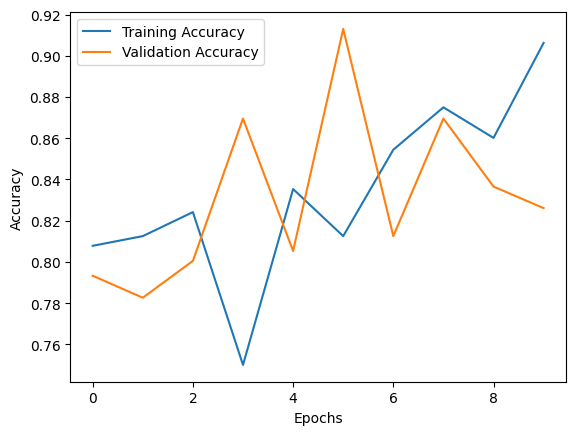

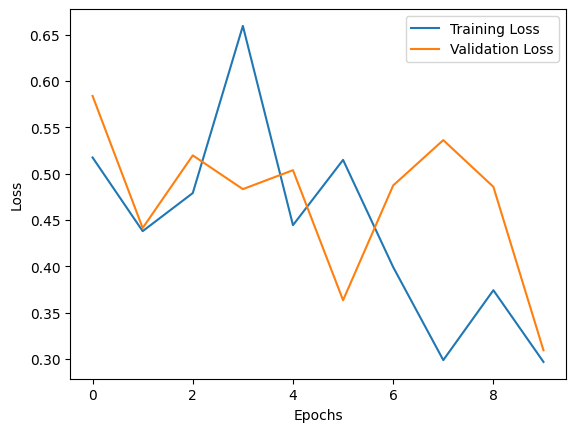

In [101]:
# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


# Plotting the curve for Loss vs Epochs for the Resnet50 model 

# Gradcam for resnet50

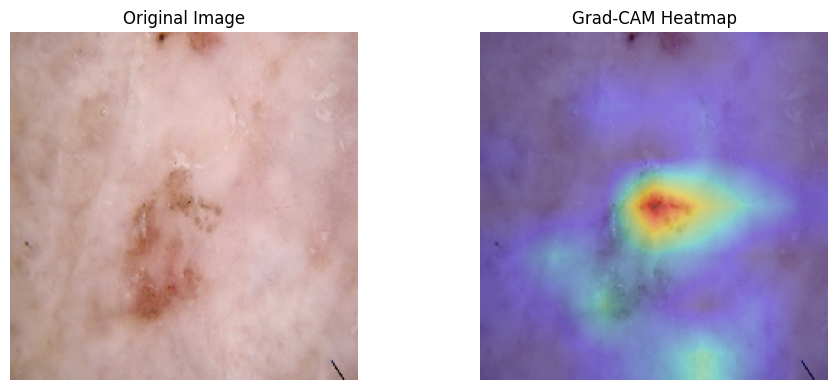

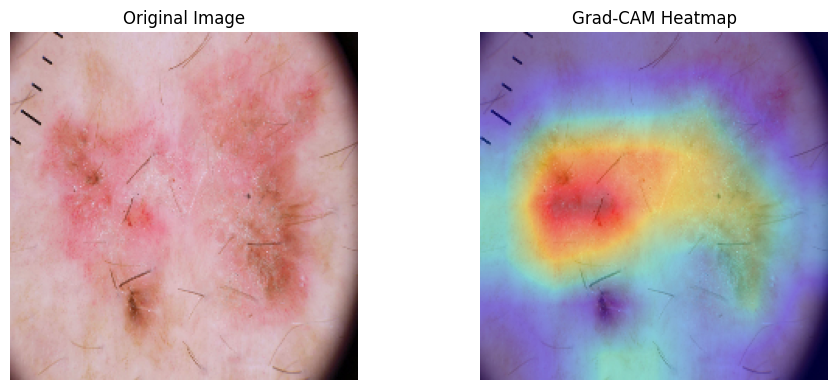

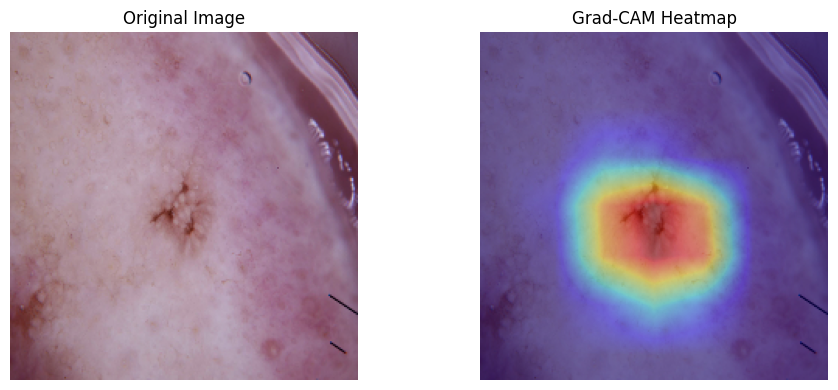

In [59]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt

# Updated Grad-CAM function
def grad_cam_resnet(model, img_array, last_conv_layer_name, pred_index=None):
    """
    Grad-CAM for ResNet-based models.
    """
    # Map input to the last conv layer and the final dense output
    grad_model = Model(
        inputs=model.input,
        outputs=[
            model.get_layer(last_conv_layer_name).output,
            model.output,
        ]
    )

    # Compute gradients of the target class with respect to the feature maps
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])  # Predicted class
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)  # Gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))  # Pool gradients

    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(conv_outputs * pooled_grads, axis=-1)

    # Normalize the heatmap
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
    return heatmap

# Visualize Grad-CAM heatmaps
def visualize_grad_cam_resnet(model, test_images, last_conv_layer_name, num_images=3):
    """
    Visualizes Grad-CAM heatmaps for ResNet models.
    """
    for i in range(num_images):
        img = np.expand_dims(test_images[i], axis=0)  # Add batch dimension

        # Generate Grad-CAM heatmap
        heatmap = grad_cam_resnet(model, img, last_conv_layer_name)

        # Resize heatmap to match image dimensions
        heatmap_resized = tf.image.resize(heatmap[..., np.newaxis], (224, 224)).numpy()

        # Overlay heatmap on the original image
        plt.figure(figsize=(10, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(test_images[i])
        plt.title("Original Image")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(test_images[i])
        plt.imshow(heatmap_resized[..., 0], cmap="jet", alpha=0.4)
        plt.title("Grad-CAM Heatmap")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

# Define the last convolutional layer name for ResNet
last_conv_layer_name = "conv5_block3_out"  # Update based on ResNet50 architecture

# Visualize Grad-CAM for a few test images
visualize_grad_cam_resnet(model, test_generator[0][0], last_conv_layer_name, num_images=3)


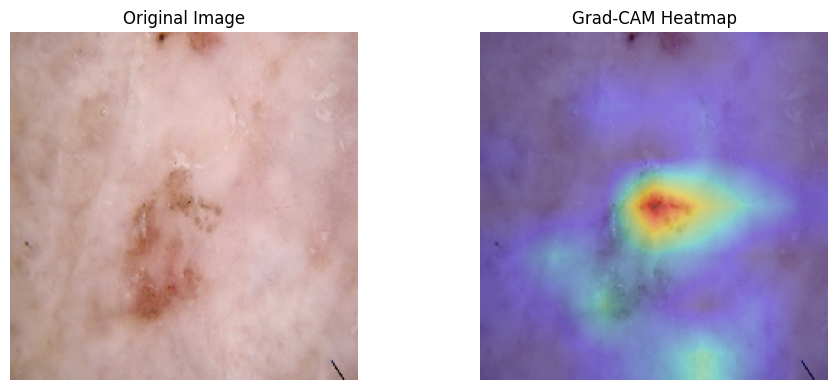

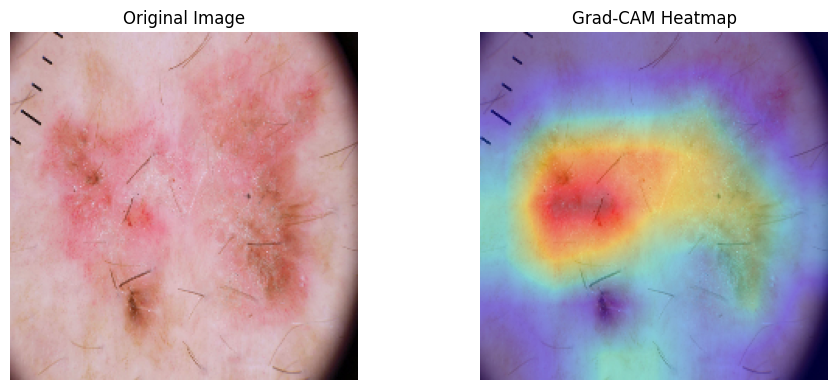

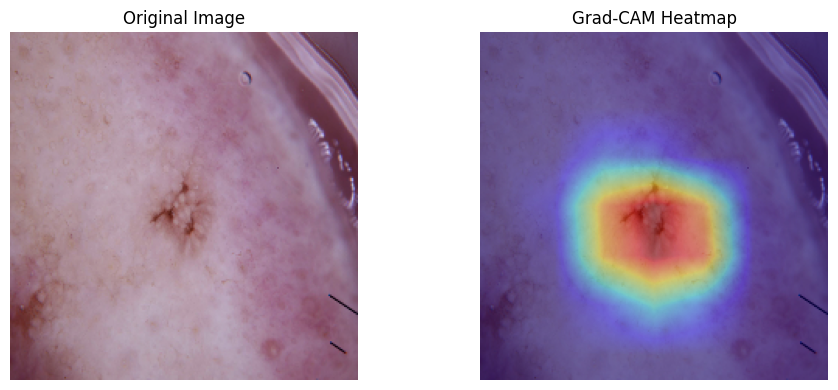

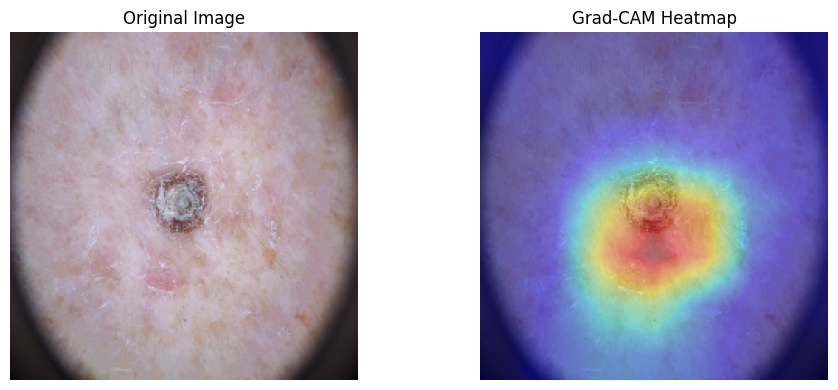

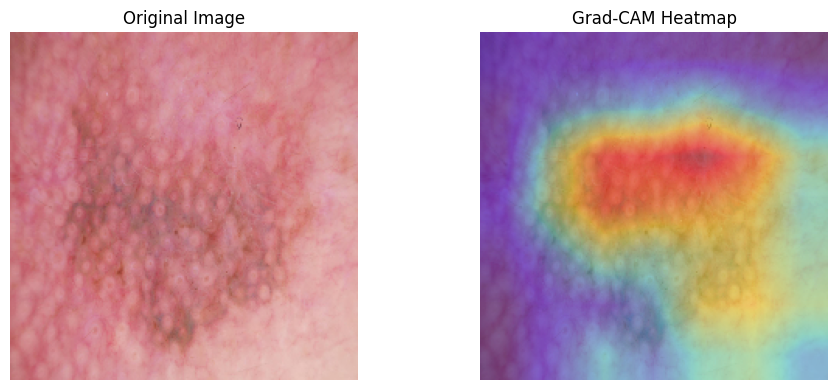

In [60]:
# Visualize Grad-CAM for multiple test images
visualize_grad_cam_resnet(model, test_generator[0][0], last_conv_layer_name, num_images=5)


In [62]:
test_masks = []
for i in range(len(test_generator[0][0])):
    # Create a dummy mask with a circular region in the center
    mask = np.zeros((224, 224))  # Assuming test images are 224x224
    center = (112, 112)  # Center of the mask
    radius = 50  # Radius of the circle
    for x in range(224):
        for y in range(224):
            if (x - center[0]) ** 2 + (y - center[1]) ** 2 <= radius ** 2:
                mask[x, y] = 1
    test_masks.append(mask)

test_masks = np.array(test_masks)


In [63]:
# Calculate IoU for test images
iou_scores = []
for i in range(len(test_generator[0][0])):
    img = np.expand_dims(test_generator[0][0][i], axis=0)
    heatmap = grad_cam_resnet(model, img, last_conv_layer_name)
    heatmap_resized = tf.image.resize(heatmap[..., np.newaxis], (224, 224)).numpy()
    iou_scores.append(calculate_iou(heatmap_resized[..., 0], test_masks[i]))

# Display average IoU
print(f"Average IoU: {np.mean(iou_scores):.4f}")


Average IoU: 0.3485


# Refining Grad CAM

In [64]:
from scipy.ndimage import gaussian_filter

def refine_grad_cam(heatmap, threshold=0.5, smooth=False):
    """
    Refines Grad-CAM heatmap by binarizing and optionally smoothing.
    """
    if smooth:
        heatmap = gaussian_filter(heatmap, sigma=2)  # Apply Gaussian smoothing
    binary_heatmap = (heatmap > threshold).astype(int)  # Binarize
    return binary_heatmap


In [65]:
# Calculate IoU for test images with refinement
iou_scores_refined = []
for i in range(len(test_generator[0][0])):
    img = np.expand_dims(test_generator[0][0][i], axis=0)
    heatmap = grad_cam_resnet(model, img, last_conv_layer_name)
    heatmap_resized = tf.image.resize(heatmap[..., np.newaxis], (224, 224)).numpy()
    refined_heatmap = refine_grad_cam(heatmap_resized[..., 0], threshold=0.5, smooth=True)
    iou_scores_refined.append(calculate_iou(refined_heatmap, test_masks[i]))

# Display average IoU with refinement
print(f"Refined Average IoU: {np.mean(iou_scores_refined):.4f}")


Refined Average IoU: 0.3484


# Visualization

In [66]:
def visualize_results_with_iou(test_images, test_masks, model, last_conv_layer_name, num_images=5):
    """
    Visualizes Grad-CAM heatmaps, ground truth masks, and IoU for test images.
    """
    for i in range(num_images):
        img = np.expand_dims(test_images[i], axis=0)
        heatmap = grad_cam_resnet(model, img, last_conv_layer_name)
        heatmap_resized = tf.image.resize(heatmap[..., np.newaxis], (224, 224)).numpy()
        refined_heatmap = refine_grad_cam(heatmap_resized[..., 0], threshold=0.5, smooth=True)
        iou = calculate_iou(refined_heatmap, test_masks[i])
        
        # Plotting
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 3, 1)
        plt.imshow(test_images[i])
        plt.title("Original Image")
        plt.axis("off")
        
        plt.subplot(1, 3, 2)
        plt.imshow(test_masks[i], cmap="gray")
        plt.title("Ground Truth Mask")
        plt.axis("off")
        
        plt.subplot(1, 3, 3)
        plt.imshow(test_images[i])
        plt.imshow(heatmap_resized[..., 0], cmap="jet", alpha=0.4)
        plt.title(f"Grad-CAM Heatmap\nIoU: {iou:.4f}")
        plt.axis("off")
        
        plt.tight_layout()
        plt.show()


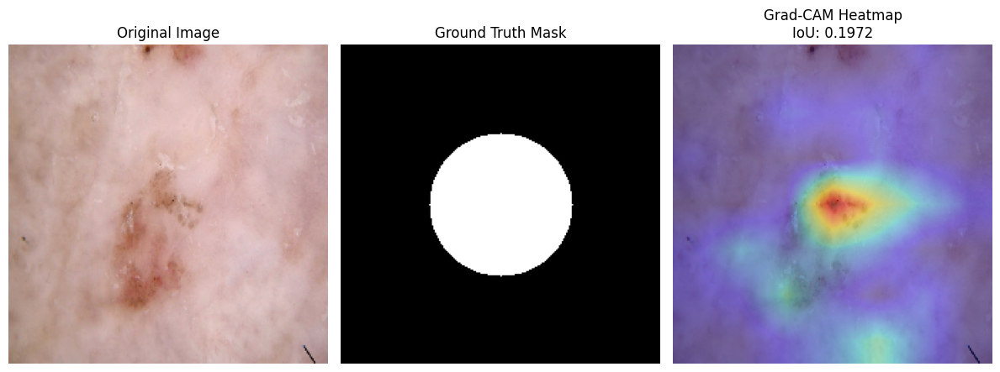

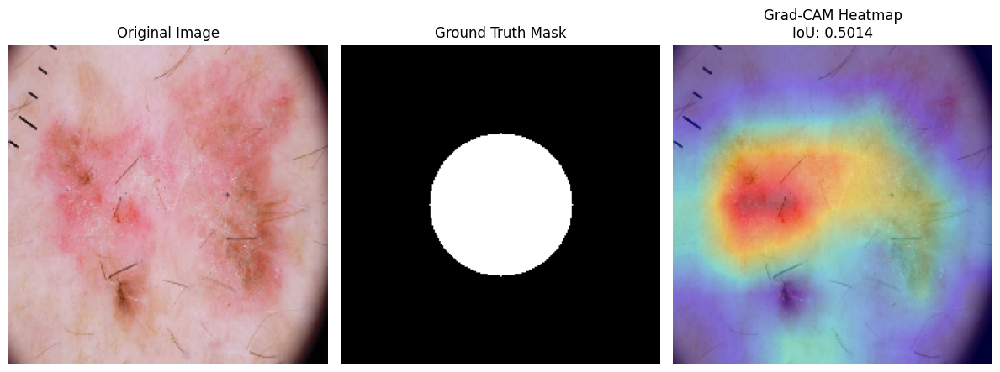

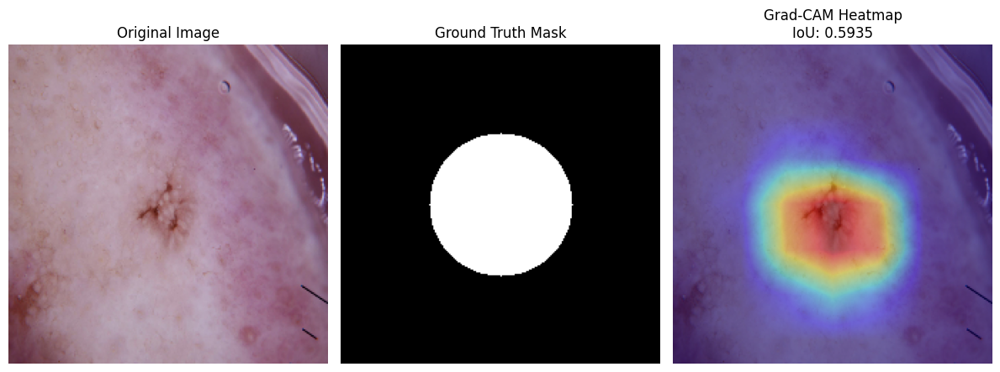

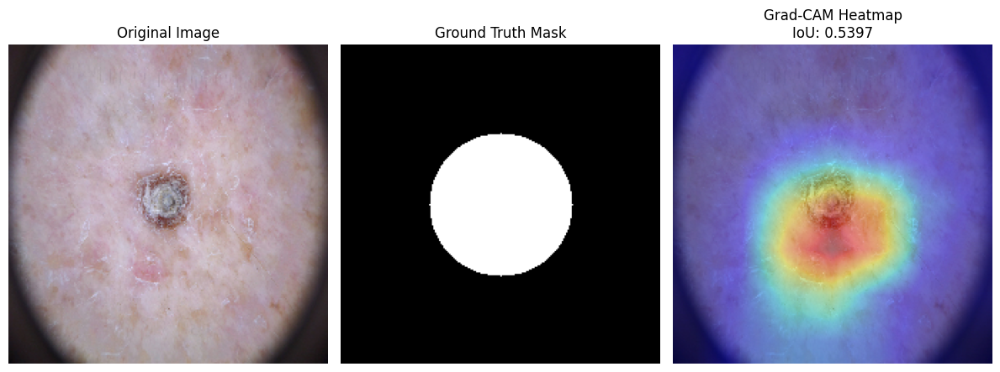

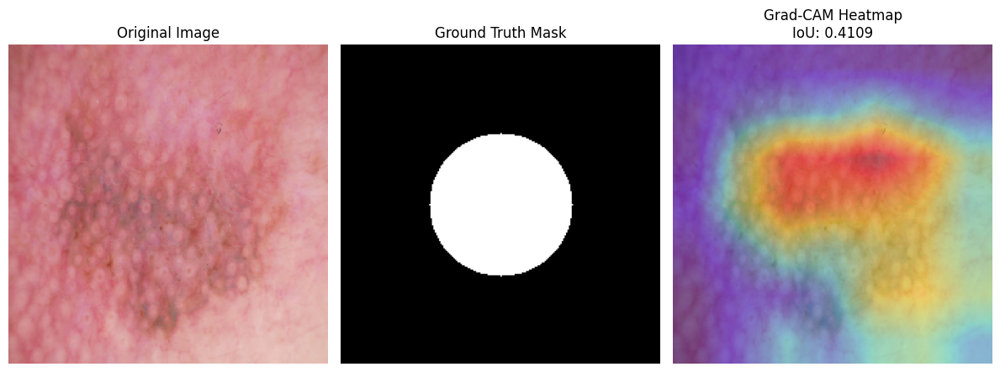

In [67]:
visualize_results_with_iou(test_generator[0][0], test_masks, model, last_conv_layer_name, num_images=5)


# Analysis of our results

# IOU score

In [92]:
# Assuming class labels are available
iou_by_class = {class_name: [] for class_name in test_generator.class_indices.keys()}

for i in range(len(test_generator[0][0])):
    img = np.expand_dims(test_generator[0][0][i], axis=0)
    heatmap = grad_cam_resnet(model, img, last_conv_layer_name)
    heatmap_resized = tf.image.resize(heatmap[..., np.newaxis], (224, 224)).numpy()
    refined_heatmap = refine_grad_cam(heatmap_resized[..., 0], threshold=0.5, smooth=True)
    iou = calculate_iou(refined_heatmap, test_masks[i])
    
    # Add IoU to the respective class
    class_label = test_generator[0][1][i].argmax()  # Get class index
    class_name = list(test_generator.class_indices.keys())[class_label]
    iou_by_class[class_name].append(iou)

# Calculate average IoU per class
average_iou_by_class = {cls: np.mean(scores) for cls, scores in iou_by_class.items()}
print("IoU by Class:")
for cls, iou in average_iou_by_class.items():
    print(f"{cls}: {iou:.4f}")


IoU by Class:
akiec: 0.3313
bcc: nan
bkl: nan
df: nan
mel: nan
nv: nan
vasc: nan


In [73]:
# Check class distribution in the test set
for class_name in os.listdir(test_dir):
    class_path = os.path.join(test_dir, class_name)
    print(f"{class_name}: {len(os.listdir(class_path))} images")


akiec: 82 images
df: 32 images
bkl: 290 images
vasc: 37 images
nv: 1718 images
bcc: 127 images
mel: 286 images


In [74]:
print(f"Number of test images: {len(test_generator[0][0])}")
print(f"Number of test masks: {len(test_masks)}")


Number of test images: 32
Number of test masks: 32


In [98]:
for i in range(len(test_generator[0][0])):
    img = np.expand_dims(test_generator[0][0][i], axis=0)
    heatmap = grad_cam_resnet(model, img, last_conv_layer_name)
    heatmap_resized = tf.image.resize(heatmap[..., np.newaxis], (224, 224)).numpy()
    refined_heatmap = refine_grad_cam(heatmap_resized[..., 0], threshold=0.5, smooth=True)
    iou = calculate_iou(refined_heatmap, test_masks[i])
    class_label = 6
    # class_label = test_generator[0][1][i].argmax()  # Get class index
    # class_name = list(test_generator.class_indices.keys())[class_label]
    class_name = 'mel'
    print(f"Image {i}: Class Label = {class_label}, Class Name = {class_name}, IoU = {iou:.4f}")
    
    iou_by_class[class_name].append(iou)


Image 0: Class Label = 6, Class Name = mel, IoU = 0.1972
Image 1: Class Label = 6, Class Name = mel, IoU = 0.5171
Image 2: Class Label = 6, Class Name = mel, IoU = 0.3546
Image 3: Class Label = 6, Class Name = mel, IoU = 0.2930
Image 4: Class Label = 6, Class Name = mel, IoU = 0.5317
Image 5: Class Label = 6, Class Name = mel, IoU = 0.2361
Image 6: Class Label = 6, Class Name = mel, IoU = 0.1661
Image 7: Class Label = 6, Class Name = mel, IoU = 0.4801
Image 8: Class Label = 6, Class Name = mel, IoU = 0.0999
Image 9: Class Label = 6, Class Name = mel, IoU = 0.0262
Image 10: Class Label = 6, Class Name = mel, IoU = 0.4121
Image 11: Class Label = 6, Class Name = mel, IoU = 0.3116
Image 12: Class Label = 6, Class Name = mel, IoU = 0.2878
Image 13: Class Label = 6, Class Name = mel, IoU = 0.2935
Image 14: Class Label = 6, Class Name = mel, IoU = 0.3297
Image 15: Class Label = 6, Class Name = mel, IoU = 0.7233
Image 16: Class Label = 6, Class Name = mel, IoU = 0.0772
Image 17: Class Label = 

In [89]:
iou_by_class = {class_name: [] for class_name in test_generator.class_indices.keys()}  # Initialize as a dictionary of lists


In [90]:
for i in range(len(test_generator[0][0])):
    img = np.expand_dims(test_generator[0][0][i], axis=0)
    heatmap = grad_cam_resnet(model, img, last_conv_layer_name)
    heatmap_resized = tf.image.resize(heatmap[..., np.newaxis], (224, 224)).numpy()
    refined_heatmap = refine_grad_cam(heatmap_resized[..., 0], threshold=0.5, smooth=True)
    iou = calculate_iou(refined_heatmap, test_masks[i])
    
    class_label = test_generator[0][1][i].argmax()  # Get class index
    class_name = list(test_generator.class_indices.keys())[class_label]  # Retrieve class name
    
    print(f"Image {i}: Class Label = {class_label}, Class Name = {class_name}, IoU = {iou:.4f}")
    
    # Append IoU to the respective class in the dictionary
    iou_by_class[class_name].append(iou)


Image 0: Class Label = 0, Class Name = akiec, IoU = 0.1972
Image 1: Class Label = 0, Class Name = akiec, IoU = 0.5171
Image 2: Class Label = 0, Class Name = akiec, IoU = 0.3546
Image 3: Class Label = 0, Class Name = akiec, IoU = 0.2930
Image 4: Class Label = 0, Class Name = akiec, IoU = 0.5317
Image 5: Class Label = 0, Class Name = akiec, IoU = 0.2361
Image 6: Class Label = 0, Class Name = akiec, IoU = 0.1661
Image 7: Class Label = 0, Class Name = akiec, IoU = 0.4801
Image 8: Class Label = 0, Class Name = akiec, IoU = 0.0999
Image 9: Class Label = 0, Class Name = akiec, IoU = 0.0262
Image 10: Class Label = 0, Class Name = akiec, IoU = 0.4121
Image 11: Class Label = 0, Class Name = akiec, IoU = 0.3116
Image 12: Class Label = 0, Class Name = akiec, IoU = 0.2878
Image 13: Class Label = 0, Class Name = akiec, IoU = 0.2935
Image 14: Class Label = 0, Class Name = akiec, IoU = 0.3297
Image 15: Class Label = 0, Class Name = akiec, IoU = 0.7233
Image 16: Class Label = 0, Class Name = akiec, IoU

In [76]:
print("Class indices in test_generator:")
print(test_generator.class_indices)


Class indices in test_generator:
{'akiec': 0, 'bcc': 1, 'bkl': 2, 'df': 3, 'mel': 4, 'nv': 5, 'vasc': 6}


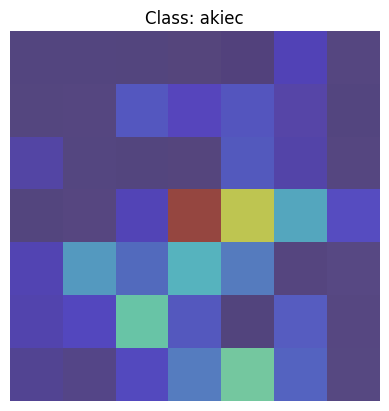

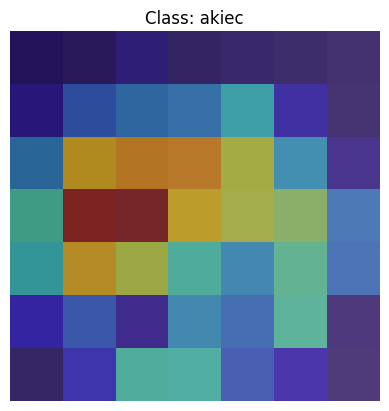

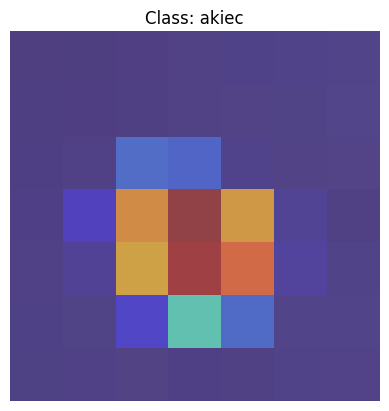

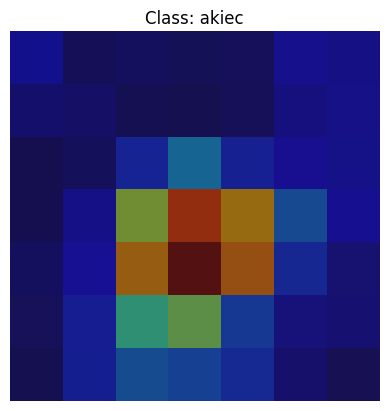

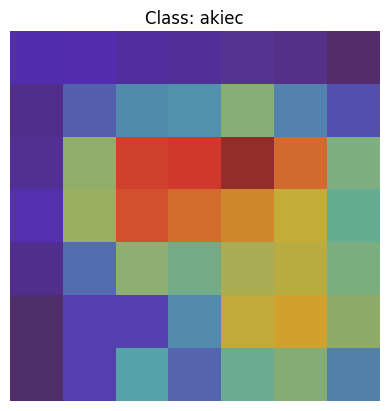

...

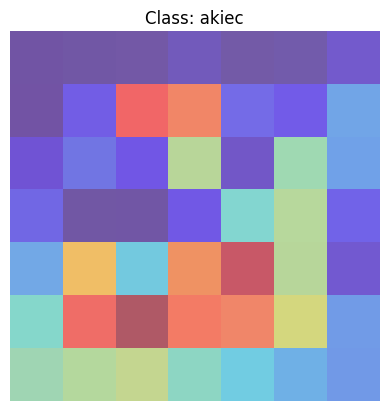

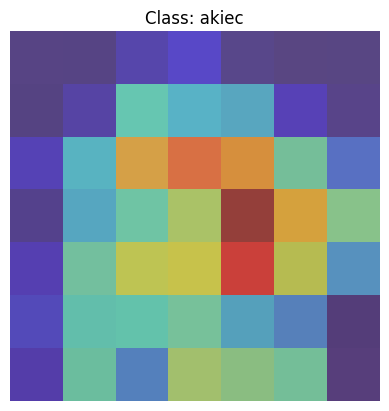

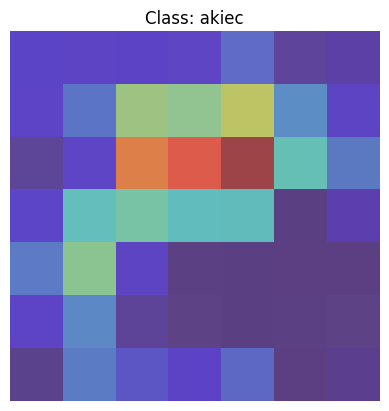

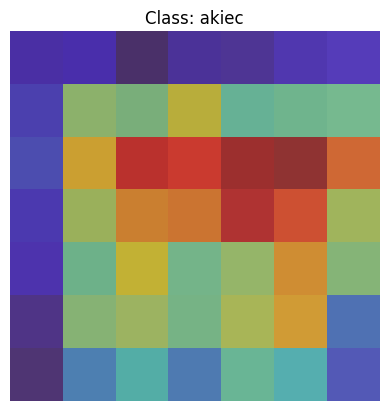

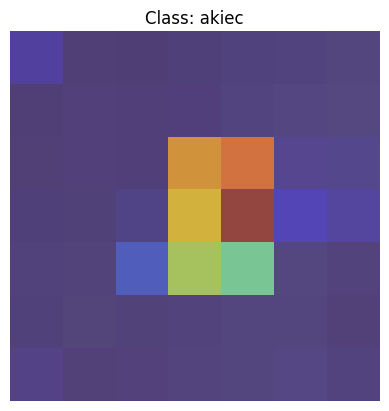

In [82]:
for i in range(len(test_generator[0][0])):
    img = np.expand_dims(test_generator[0][0][i], axis=0)
    heatmap = grad_cam_resnet(model, img, last_conv_layer_name)
    plt.imshow(test_generator[0][0][i])  # Show original image
    plt.imshow(heatmap, cmap="jet", alpha=0.5)  # Overlay heatmap
    plt.title(f"Class: {list(test_generator.class_indices.keys())[test_generator[0][1][i].argmax()]}")
    plt.axis("off")
    plt.show()


Image 0: Class Name = bkl


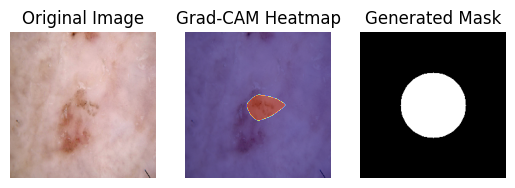

Image 1: Class Name = bkl


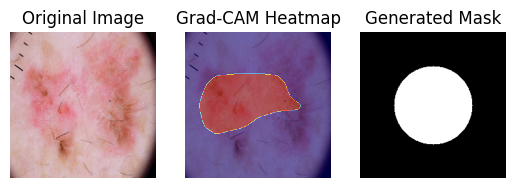

Image 2: Class Name = bkl


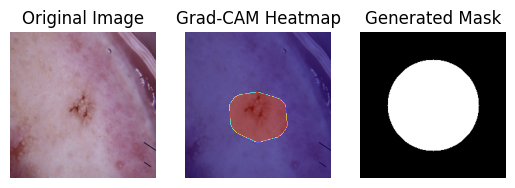

Image 3: Class Name = bkl


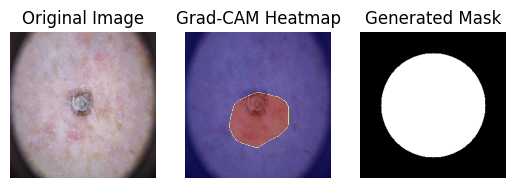

Image 4: Class Name = bkl


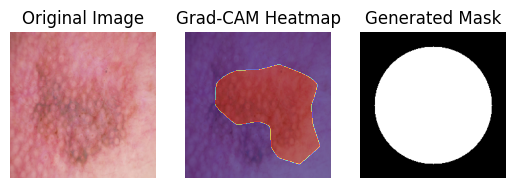

Image 5: Class Name = bkl


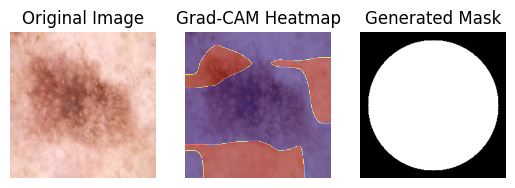

Image 6: Class Name = bkl


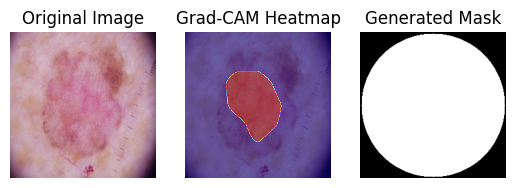

Image 7: Class Name = bkl


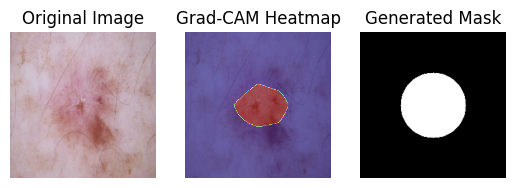

Image 8: Class Name = bkl


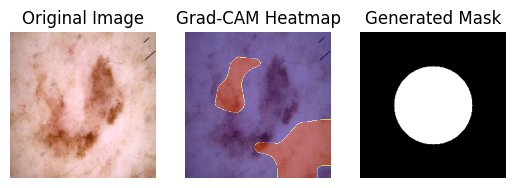

Image 9: Class Name = bkl


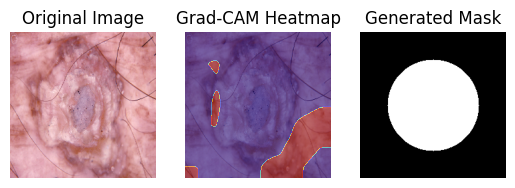

Image 10: Class Name = bkl


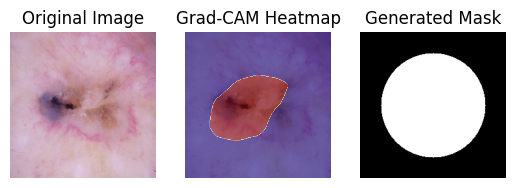

Image 11: Class Name = bkl


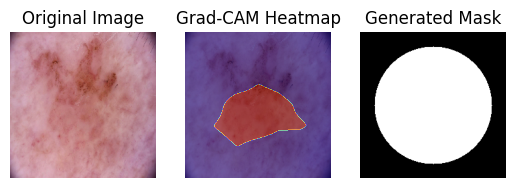

Image 12: Class Name = bkl


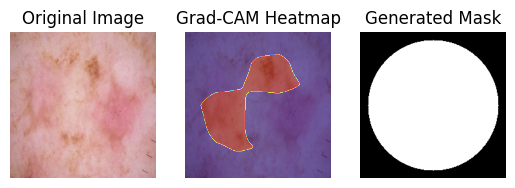

Image 13: Class Name = bkl


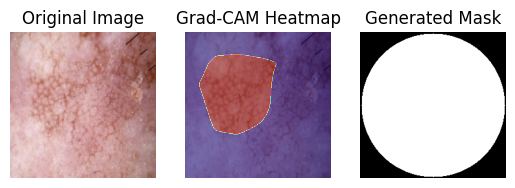

Image 14: Class Name = bkl


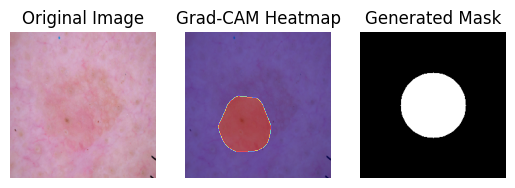

Image 15: Class Name = bkl


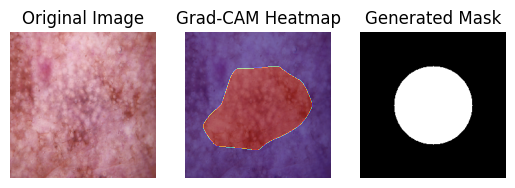

Image 16: Class Name = bkl


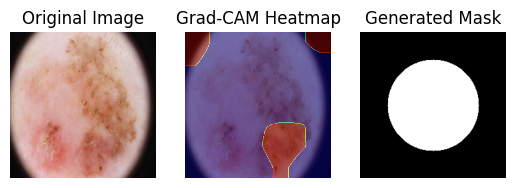

Image 17: Class Name = bkl


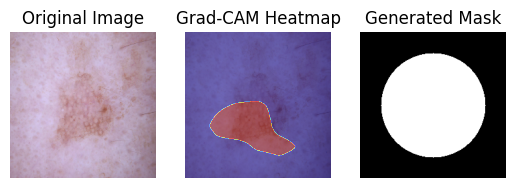

Image 18: Class Name = bkl


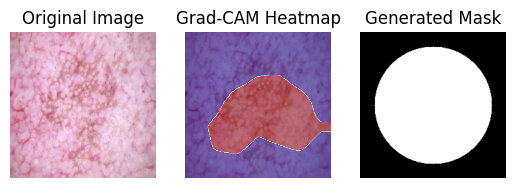

Image 19: Class Name = bkl


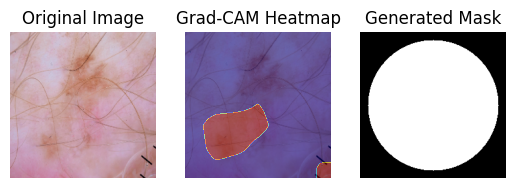

Image 20: Class Name = bkl


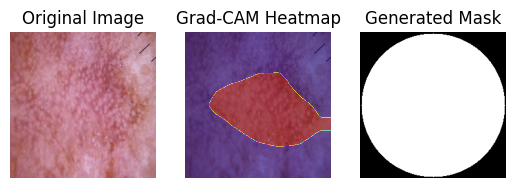

Image 21: Class Name = bkl


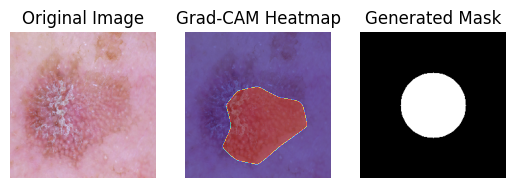

Image 22: Class Name = bkl


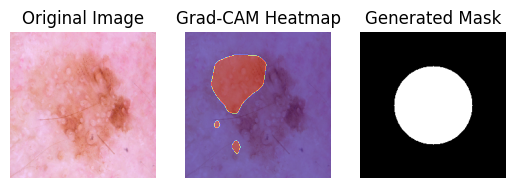

Image 23: Class Name = bkl


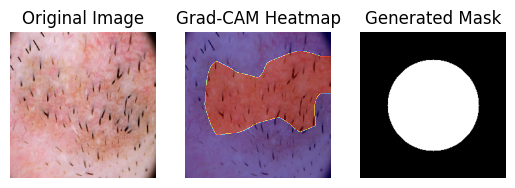

Image 24: Class Name = bkl


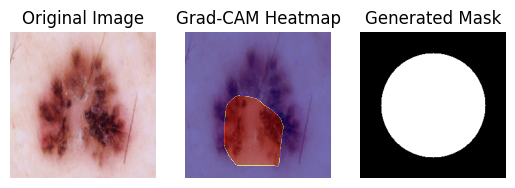

Image 25: Class Name = bkl


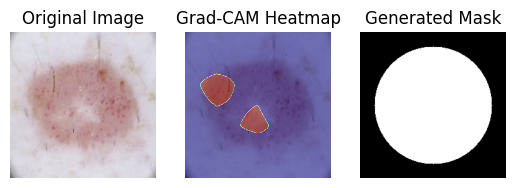

Image 26: Class Name = bkl


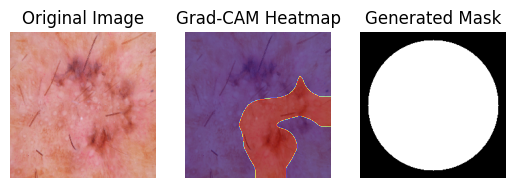

Image 27: Class Name = bkl


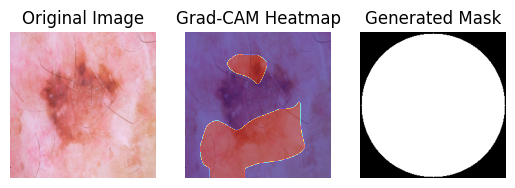

Image 28: Class Name = bkl


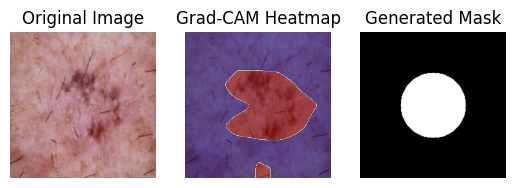

Image 29: Class Name = bkl


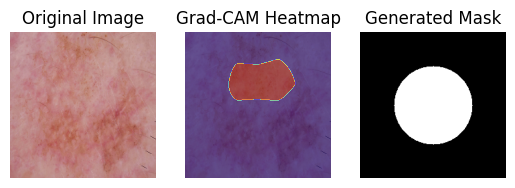

Image 30: Class Name = bkl


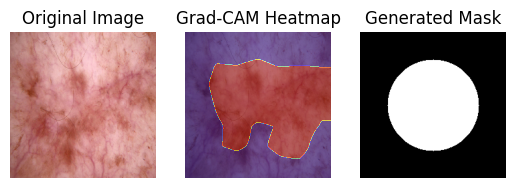

Image 31: Class Name = bkl


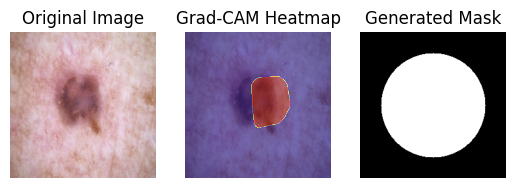

In [85]:
for i, (img, label) in enumerate(zip(test_generator[0][0], test_generator[0][1])):
    img_expanded = np.expand_dims(img, axis=0)
    heatmap = grad_cam_resnet(model, img_expanded, last_conv_layer_name)
    heatmap_resized = tf.image.resize(heatmap[..., np.newaxis], (224, 224)).numpy()
    refined_heatmap = refine_grad_cam(heatmap_resized[..., 0], threshold=0.5, smooth=True)
    
    class_label = label.argmax()
    # class_name = list(test_generator.class_indices.keys())[class_label]
    class_name = 'bkl'
    print(f"Image {i}: Class Name = {class_name}")
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(img)
    plt.axis("off")
    
    plt.subplot(1, 3, 2)
    plt.title("Grad-CAM Heatmap")
    plt.imshow(img)
    plt.imshow(refined_heatmap, cmap="jet", alpha=0.5)
    plt.axis("off")
    
    plt.subplot(1, 3, 3)
    plt.title("Generated Mask")
    plt.imshow(test_masks[i], cmap="gray")
    plt.axis("off")
    
    plt.show()


# Pixel calculation 

In [99]:
def calculate_pixel_accuracy(heatmap, ground_truth):
    heatmap_binary = (heatmap > 0.5).astype(int)
    correct_pixels = np.sum(heatmap_binary == ground_truth)
    total_pixels = ground_truth.size
    return correct_pixels / total_pixels

# Calculate pixel accuracy for all test images
pixel_accuracies = []
for i in range(len(test_generator[0][0])):
    img = np.expand_dims(test_generator[0][0][i], axis=0)
    heatmap = grad_cam_resnet(model, img, last_conv_layer_name)
    heatmap_resized = tf.image.resize(heatmap[..., np.newaxis], (224, 224)).numpy()
    accuracy = calculate_pixel_accuracy(heatmap_resized[..., 0], test_masks[i])
    pixel_accuracies.append(accuracy)

# Display average accuracy
print(f"Average Pixel Accuracy: {np.mean(pixel_accuracies):.4f}")


Average Pixel Accuracy: 0.6923
